In [1]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import seaborn as sns

from torch.utils.data import Dataset, DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, SpectralClustering
from sklearn.metrics import (
    silhouette_score,
    adjusted_rand_score,
    normalized_mutual_info_score
)
from sklearn.manifold import TSNE
import umap
from sentence_transformers import SentenceTransformer

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

2026-03-22 15:58:01.899381: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1774195082.085987      55 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1774195082.138591      55 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1774195082.598639      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1774195082.598675      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1774195082.598678      55 computation_placer.cc:177] computation placer alr

cuda


In [ ]:
pip install sentence-transformers

Note: you may need to restart the kernel to use updated packages.


=== Missing Values per Column ===
id                         0
name                       3
album_name                20
artists                    0
danceability               0
energy                     0
key                        0
loudness                   0
mode                       0
speechiness                0
acousticness               0
instrumentalness           0
liveness                   0
valence                    0
tempo                      0
duration_ms                0
lyrics                     0
year                       0
genre                      0
popularity                 0
total_artist_followers     0
avg_artist_popularity      0
artist_ids                 0
niche_genres               0
dtype: int64
=== After Replacing Missing Values ===
name                      0
album_name                0
artists                   0
danceability              0
energy                    0
key                       0
loudness                  0
mode                  

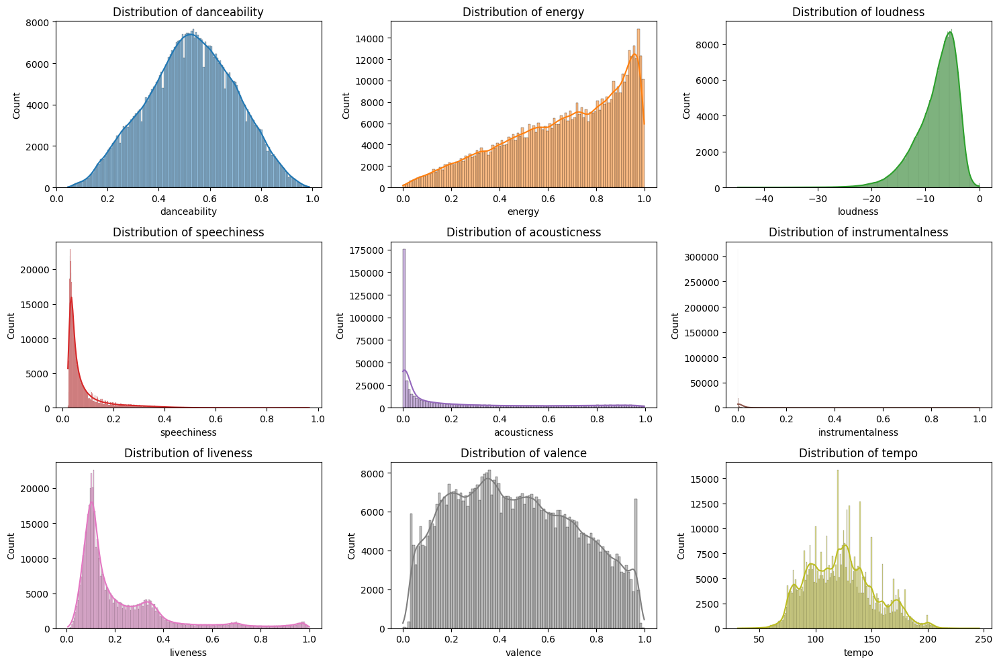

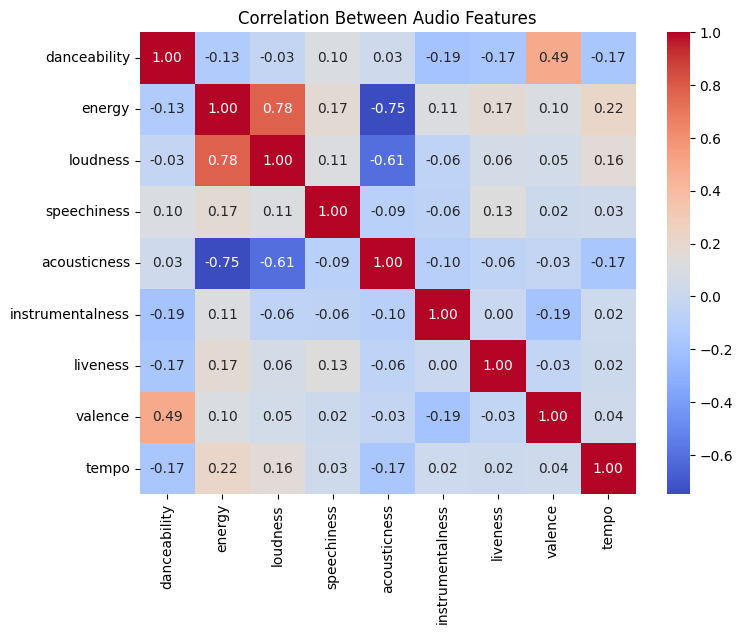

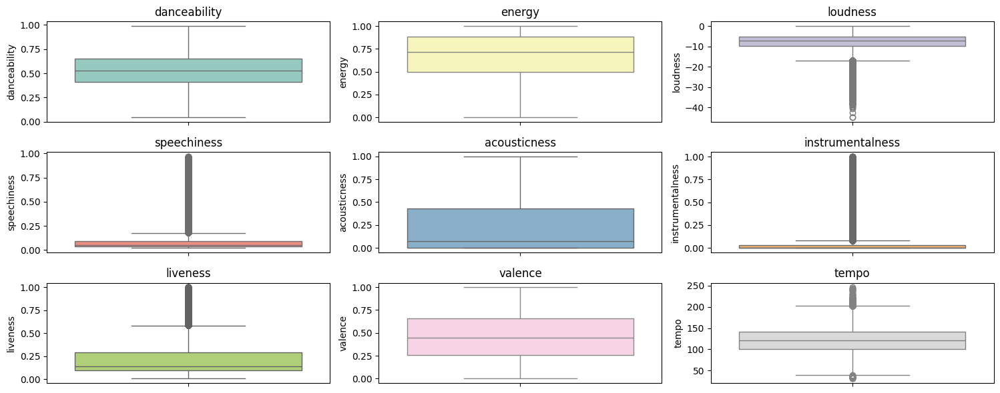

In [3]:
# Load Dataset
df = pd.read_csv("/kaggle/input/datasets/sabrina001/550k-music-dataset/songs.csv")  

# Keep only relevant numeric/audio features for this analysis and also they are the input dimension
audio_cols = ['danceability','energy','loudness','speechiness','acousticness','instrumentalness','liveness','valence','tempo']

# Check for missing/null values
print("=== Missing Values per Column ===")
#print(df[audio_cols + ['lyrics','genre']].isnull().sum())
print(df.isnull().sum())

print("=== After Replacing Missing Values ===")
# Drop the 'id' column
df = df.drop(columns=['id'])

# Handle 'name' missing values (Replace with "Unknown")
df['name'] = df['name'].fillna("Unknown Name")

# Handle 'album_name' missing values (Replace with most common album)
df['album_name'] = df['album_name'].fillna(df['album_name'].mode()[0])

# Verify the results
print(df.isnull().sum())
print(df.head())

# Descriptive statistics
desc_stats = df[audio_cols].describe().T
print("=== Descriptive Statistics ===")
print(desc_stats)

# Add range (max - min) for each column
desc_stats['range'] = desc_stats['max'] - desc_stats['min']
print("\n=== Descriptive Stats with Range ===")
print(desc_stats)

# Feature Distribution Plots
plt.figure(figsize=(15,10))
for i, col in enumerate(audio_cols):
    plt.subplot(3,3,i+1)
    sns.histplot(df[col], kde=True, color=sns.color_palette("tab10")[i])
    plt.title(f'Distribution of {col}')
plt.tight_layout()
plt.show()

# Feature Distribution Plots (for all cols)
'''
cols = ['release_date','len']
plt.figure(figsize=(15,10))
for i, col in enumerate(cols):
    plt.subplot(1,2,i+1)
    sns.histplot(df[col], kde=True, color=sns.color_palette("tab10")[i])
    plt.title(f'Distribution of {col}')
plt.tight_layout()
plt.show()
'''
# Correlation Heatmap
plt.figure(figsize=(8,6))
sns.heatmap(df[audio_cols].corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Between Audio Features")
plt.show()

# Boxplots to check for outliers
plt.figure(figsize=(15,6))
for i, col in enumerate(audio_cols):
    plt.subplot(3,3,i+1)
    sns.boxplot(y=df[col], color=sns.color_palette("Set3")[i])
    plt.title(col)
plt.tight_layout()
plt.show()


In [4]:
# Take small subset
df = df.sample(25000, random_state=42)

print(df.shape)
df.head

(25000, 23)


<bound method NDFrame.head of                             name  \
313554             Naive Monarch   
210119  I Can't Live Without You   
136837              Erase It All   
460801              The Majestic   
19995   Ain't What It Used To Be   
...                          ...   
425787          Stone Cold Fever   
385951                Satellites   
141658      Exhaustion & Disgust   
191135                      Heat   
54212                  Big Girls   

                                               album_name  \
313554                                           Versions   
210119                           I Can't Live Without You   
136837                                          Hail Mary   
460801                         Cup of Sand (2017 Reissue)   
19995                                    Billy Currington   
...                                                   ...   
425787  20th Century Masters:The Millennium Collection...   
385951                            Periphery IV: H

In [5]:
# Audio Features Preprocessing
audio_features = df[['danceability','energy','loudness','speechiness','acousticness','instrumentalness','liveness','valence','tempo']].values
scaler = StandardScaler()
audio_scaled = scaler.fit_transform(audio_features)

# Lyrics Preprocessing (TF-IDF)
'''tfidf = TfidfVectorizer(max_features=1000, stop_words='english')
lyrics_tfidf = tfidf.fit_transform(df['lyrics']).toarray()
print(f"Lyrics embedding shape: {lyrics_tfidf.shape}")
'''
# Lyrics Preprocessing (Sentence Transformer)

# Load pre-trained model
model = SentenceTransformer('all-MiniLM-L6-v2')  
# Convert lyrics column to list
lyrics_list = df['lyrics'].astype(str).tolist()

# Generate embeddings
lyrics_embeddings = model.encode(
    lyrics_list,
    batch_size=64,
    show_progress_bar=True
)
print("Lyrics embedding shape:", lyrics_embeddings.shape)

# Encode Genres
le = LabelEncoder()
genre_labels = le.fit_transform(df['genre'].values)
num_genres = len(le.classes_)
print(f"Number of genres: {num_genres}")

# One-hot encoding for CVAE
genre_onehot = np.eye(num_genres)[genre_labels]

# PyTorch Dataset
class MusicDataset(Dataset):
    def __init__(self, audio, lyrics, genre_onehot):
        self.audio = torch.tensor(audio, dtype=torch.float32)
        self.lyrics = torch.tensor(lyrics, dtype=torch.float32)
        self.genre = torch.tensor(genre_onehot, dtype=torch.float32)
    def __len__(self):
        return len(self.audio)
    def __getitem__(self, idx):
        return self.audio[idx], self.lyrics[idx], self.genre[idx]

dataset = MusicDataset(audio_scaled, lyrics_embeddings, genre_onehot)
dataloader = DataLoader(dataset, batch_size=128, shuffle=True)

# Conditional VAE / Beta-VAE
class CVAE(nn.Module):
    def __init__(self, audio_dim, lyrics_dim, genre_dim, latent_dim=16, beta=1.0):
        super(CVAE, self).__init__()
        self.beta = beta

        # Encoder (NO GENRE HERE)
        self.encoder = nn.Sequential(
            nn.Linear(audio_dim + lyrics_dim, 256),
            nn.ReLU(),
            nn.Linear(256, 128),
            nn.ReLU()
        )

        self.fc_mu = nn.Linear(128, latent_dim)
        self.fc_logvar = nn.Linear(128, latent_dim)

        # Decoder (GENRE IS USED HERE)
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim + genre_dim, 128),
            nn.ReLU(),
            nn.Linear(128, 256),
            nn.ReLU(),
            nn.Linear(256, audio_dim + lyrics_dim)
        )

    def encode(self, x):
        h = self.encoder(x)
        return self.fc_mu(h), self.fc_logvar(h)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z, genre_onehot):
        z = torch.cat([z, genre_onehot], dim=1)
        return self.decoder(z)

    def forward(self, x, genre_onehot):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        recon = self.decode(z, genre_onehot)
        return recon, mu, logvar

# Loss function
def loss_function(recon, x, mu, logvar, beta=1.0):
    # MSE per sample
    MSE = torch.mean(torch.sum((recon - x)**2, dim=1))
    # KLD per sample
    KLD = -0.5 * torch.mean(torch.sum(1 + logvar - mu.pow(2) - logvar.exp(), dim=1))
    return MSE + beta * KLD, MSE, KLD

audio_dim = audio_scaled.shape[1]
lyrics_dim = lyrics_embeddings.shape[1]
genre_dim = genre_onehot.shape[1]

print("Audio dim:", audio_dim)
print("Lyrics dim:", lyrics_dim)
print("Genre dim:", genre_dim)
print("Total CVAE input dim:", audio_dim + lyrics_dim + genre_dim)

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Batches:   0%|          | 0/391 [00:00<?, ?it/s]

Lyrics embedding shape: (25000, 384)
Number of genres: 10
Audio dim: 9
Lyrics dim: 384
Genre dim: 10
Total CVAE input dim: 403


In [ ]:
latent_dims = [8, 16, 32]
betas = [0.5, 1.0, 4.0]
learning_rates = [1e-3, 3e-3, 5e-3]

cluster_options = [4, 5, 6, 8]   

In [ ]:
# Purity function
def purity_score(y_true, y_pred):
    contingency_matrix = pd.crosstab(y_true, y_pred)
    return np.sum(np.max(contingency_matrix.values, axis=0)) / np.sum(contingency_matrix.values)

# CVAE + kmeans with Hyperparameter Tuning
all_runs = []
epochs = 50
for latent_dim in latent_dims:
    for beta in betas:
        for lr in learning_rates:
            for k in cluster_options:
                losses_mse = []
                losses_kld = []

                print(f"\nCVAE: latent={latent_dim}, beta={beta}, lr={lr}, clusters={k}")

                model = CVAE(audio_dim, lyrics_dim, genre_dim,
                             latent_dim=latent_dim, beta=beta).to(device)

                optimizer = torch.optim.Adam(model.parameters(), lr=lr)

                for epoch in range(epochs):
                    model.train()
                    epoch_total = 0
                    epoch_mse = 0
                    epoch_kld = 0
        
                    for audio, lyrics, genre in dataloader:
                        audio, lyrics, genre = audio.to(device), lyrics.to(device), genre.to(device)
                        x = torch.cat([audio, lyrics], dim=1)

                        optimizer.zero_grad()
                        recon, mu, logvar = model(x, genre)
                        loss, mse, kld = loss_function(recon, x, mu, logvar, beta)
                        loss.backward()
                        optimizer.step()
                        # Accumulate for epoch
                        epoch_mse += mse.item() * x.size(0)
                        epoch_kld += kld.item() * x.size(0)
                    
                    # Average over dataset
                    epoch_mse /= len(dataset)
                    epoch_kld /= len(dataset)

                    losses_mse.append(epoch_mse)
                    losses_kld.append(epoch_kld)
                    
                    print(f"Epoch {epoch+1}/{epochs}: MSE Loss={losses_mse[-1]:.12f}, KLD Loss={losses_kld[-1]:.12f}, Total Loss={losses_mse[-1]+beta*losses_kld[-1]:.12f}")

                # Extract Latent
                model.eval()
                with torch.no_grad():
                    audio_tensor = torch.tensor(audio_scaled, dtype=torch.float32).to(device)
                    lyrics_tensor = torch.tensor(lyrics_embeddings, dtype=torch.float32).to(device)
                    genre_tensor = torch.tensor(genre_onehot, dtype=torch.float32).to(device)
                    X_input = torch.cat([audio_tensor, lyrics_tensor], dim=1)
                    mu, _ = model.encode(X_input)
                    latent_features = mu.cpu().numpy()
                print(f"Latent features shape: {latent_features.shape}")
                latent_features = StandardScaler().fit_transform(latent_features)

                # Clustering
                kmeans = KMeans(n_clusters=k, random_state=42)
                cluster_labels = kmeans.fit_predict(latent_features)
                try:
                    sil = silhouette_score(latent_features, cluster_labels)
                except ValueError:
                    sil = -1
                nmi = normalized_mutual_info_score(genre_labels, cluster_labels)
                ari = adjusted_rand_score(genre_labels, cluster_labels)
                purity = purity_score(genre_labels, cluster_labels)
                
                print(f"Sil={sil:}, NMI={nmi:}, ARI={ari:}, Purity={purity:}")

                # Store run
                all_runs.append({
                    "latent_dim": latent_dim,
                    "beta": beta,
                    "lr": lr,
                    "clusters": k,
                    "silhouette": sil,
                    "nmi": nmi,
                    "ari": ari,
                    "purity": purity,
                    "latent_features": latent_features,
                    "cluster_labels": cluster_labels,
                    "model_state": model.state_dict()
                })
                
# Normalization

sil_vals = [r["silhouette"] for r in all_runs]
nmi_vals = [r["nmi"] for r in all_runs]
ari_vals = [r["ari"] for r in all_runs]
purity_vals = [r["purity"] for r in all_runs]

sil_min, sil_max = min(sil_vals), max(sil_vals)
nmi_min, nmi_max = min(nmi_vals), max(nmi_vals)
ari_min, ari_max = min(ari_vals), max(ari_vals)
purity_min, purity_max = min(purity_vals), max(purity_vals)

best_score = -1
best_cvae = None

for r in all_runs:
    sil_norm = (r["silhouette"] - sil_min) / (sil_max - sil_min + 1e-8)
    nmi_norm = (r["nmi"] - nmi_min) / (nmi_max - nmi_min + 1e-8)
    ari_norm = (r["ari"] - ari_min) / (ari_max - ari_min + 1e-8)
    purity_norm = (r["purity"] - purity_min) / (purity_max - purity_min + 1e-8)
    
    # Balanced score
    combined_score = (sil_norm + nmi_norm + ari_norm + purity_norm) / 4

    if combined_score > best_score:
        best_score = combined_score
        best_cvae = r
        torch.save(best_cvae["model_state"], "best_cvae_model.pth")
        print(f"Saved best CVAE model with .pth file.")

print("\n===== BEST CVAE CONFIG (BALANCED) =====")
print("Latent Dim:", best_cvae["latent_dim"])
print("Beta:", best_cvae["beta"])
print("Learning Rate:", best_cvae["lr"])
print("Clusters:", best_cvae["clusters"])
print("Silhouette:", best_cvae["silhouette"])
print("NMI:", best_cvae["nmi"])
print("ARI:", best_cvae["ari"])
print("Purity:", best_cvae["purity"])
print("Final Score:", best_score)


CVAE: latent=8, beta=0.5, lr=0.001, clusters=4
Epoch 1/50: MSE Loss=7.071534753876, KLD Loss=1.367922497044, Total Loss=7.755496002398
Epoch 2/50: MSE Loss=3.824261335678, KLD Loss=3.284328461838, Total Loss=5.466425566597
Epoch 3/50: MSE Loss=3.144144854813, KLD Loss=3.785860477448, Total Loss=5.037075093536
Epoch 4/50: MSE Loss=2.957620783920, KLD Loss=3.877049958725, Total Loss=4.896145763283
Epoch 5/50: MSE Loss=2.839682888107, KLD Loss=3.912179300842, Total Loss=4.795772538528
Epoch 6/50: MSE Loss=2.775444647446, KLD Loss=3.979995836029, Total Loss=4.765442565460
Epoch 7/50: MSE Loss=2.734123328781, KLD Loss=4.020070097809, Total Loss=4.744158377686
Epoch 8/50: MSE Loss=2.698561896667, KLD Loss=4.020547138596, Total Loss=4.708835465965
Epoch 9/50: MSE Loss=2.688786714249, KLD Loss=4.044719682159, Total Loss=4.711146555328
Epoch 10/50: MSE Loss=2.663365820312, KLD Loss=4.047338286209, Total Loss=4.687034963417
Epoch 11/50: MSE Loss=2.643376350632, KLD Loss=4.048865203934, Total Lo

/usr/local/lib/python3.12/dist-packages/sklearn/base.py:1389: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (6). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)


Epoch 1/50: MSE Loss=8.752162351379, KLD Loss=0.002177569364, Total Loss=8.760872628837
Epoch 2/50: MSE Loss=8.430460065918, KLD Loss=0.001860404928, Total Loss=8.437901685629
Epoch 3/50: MSE Loss=8.416329612427, KLD Loss=0.002024944675, Total Loss=8.424429391127
Epoch 4/50: MSE Loss=8.417985907440, KLD Loss=0.001185840154, Total Loss=8.422729268055
Epoch 5/50: MSE Loss=8.413686490631, KLD Loss=0.000835950141, Total Loss=8.417030291195
Epoch 6/50: MSE Loss=8.408238920593, KLD Loss=0.000836922410, Total Loss=8.411586610232
Epoch 7/50: MSE Loss=8.400439080505, KLD Loss=0.000932698339, Total Loss=8.404169873863
Epoch 8/50: MSE Loss=8.399948424072, KLD Loss=0.000744995387, Total Loss=8.402928405619
Epoch 9/50: MSE Loss=8.399367749939, KLD Loss=0.000406662945, Total Loss=8.400994401717
Epoch 10/50: MSE Loss=8.396401634521, KLD Loss=0.000311112868, Total Loss=8.397646085992
Epoch 11/50: MSE Loss=8.395094401855, KLD Loss=0.000297791568, Total Loss=8.396285568128
Epoch 12/50: MSE Loss=8.397158

Original shape: (10, 393)
Reconstruction shape: (10, 393)
Are shapes equal?  True


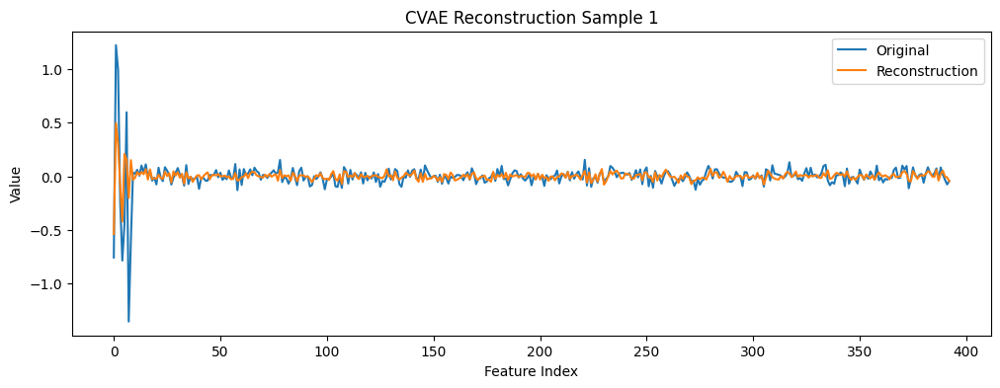

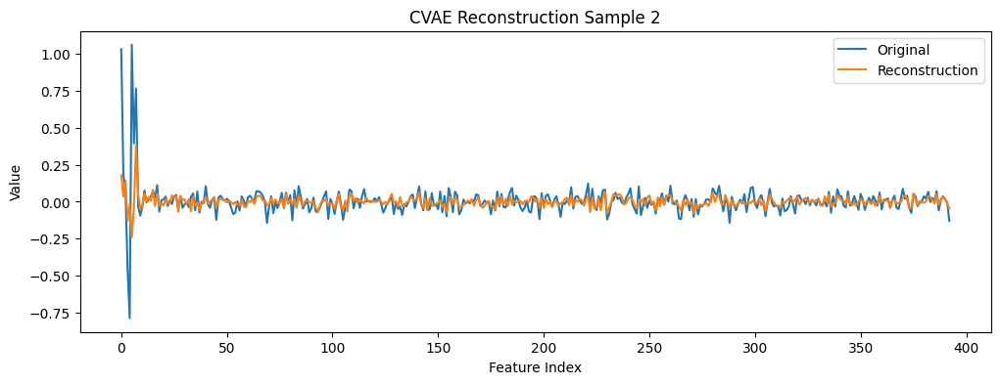

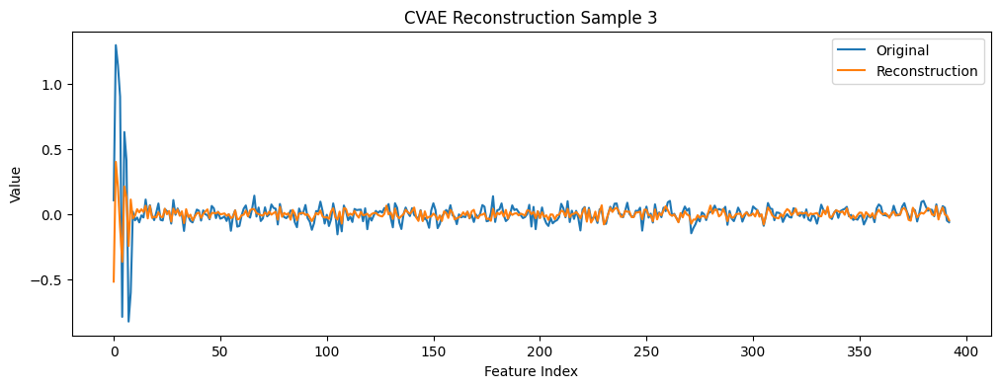

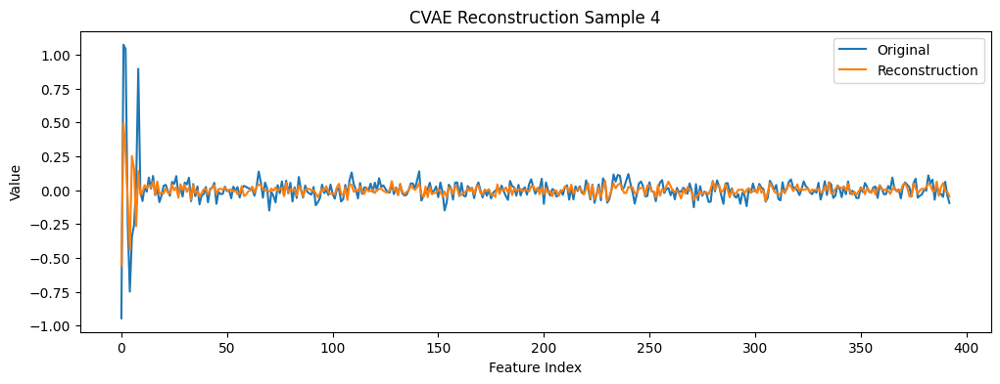

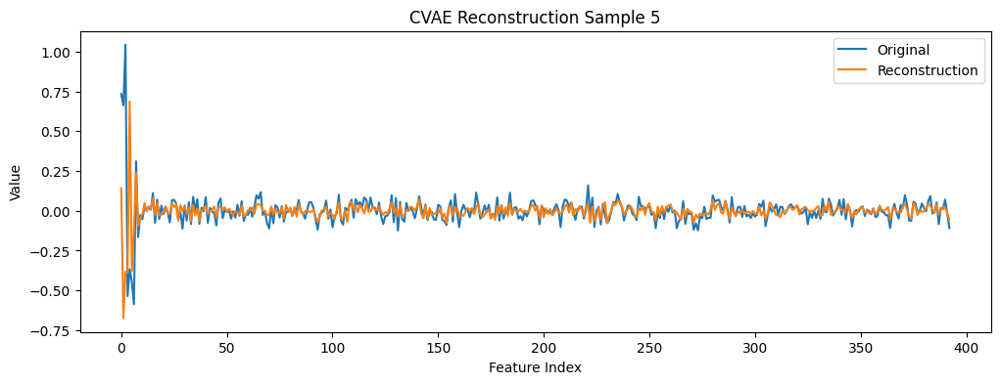

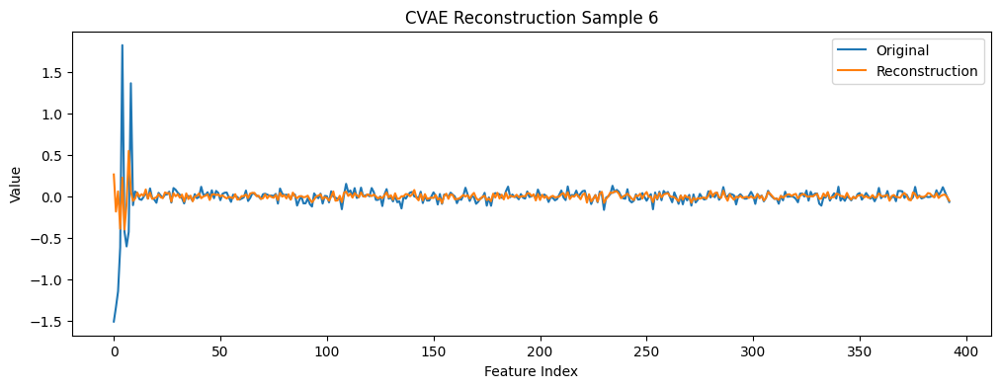

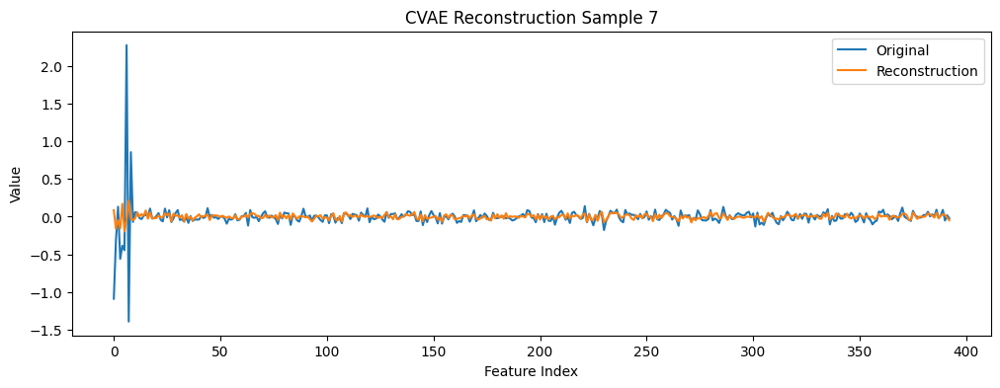

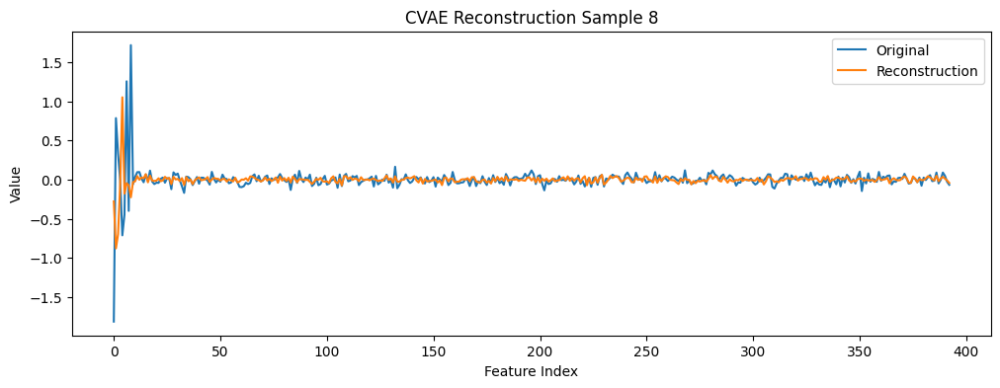

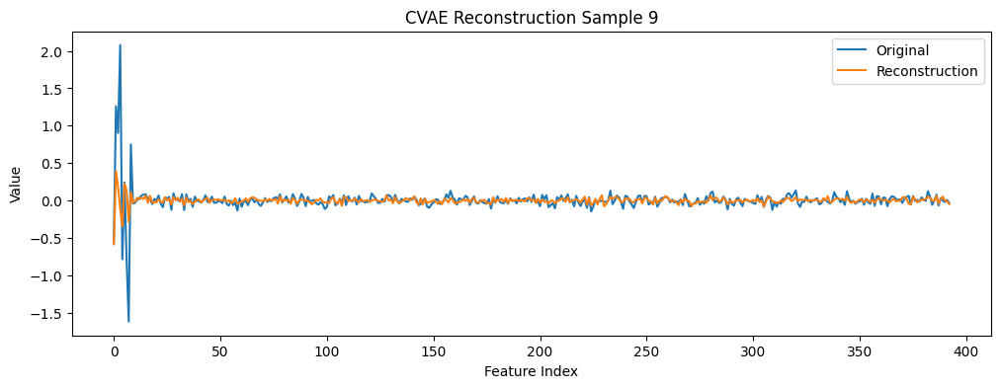

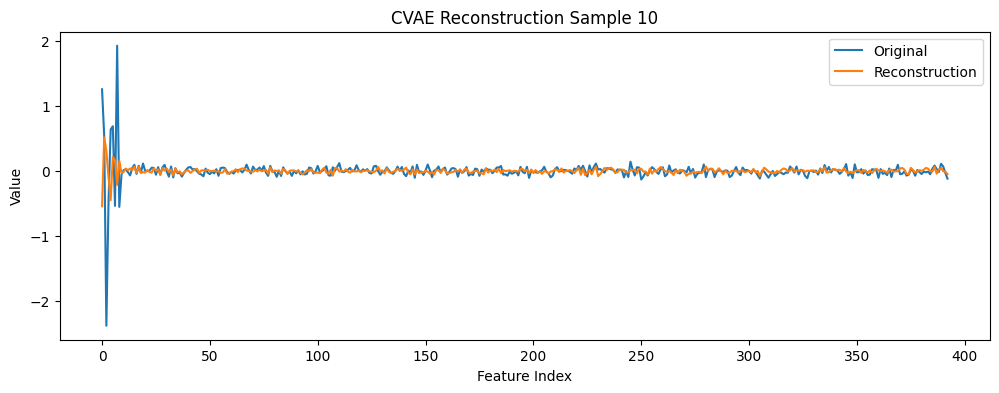

In [9]:
# Load best CVAE and do reconstructions
# Initialize model with best hyperparameters
best_latent_dim = best_cvae['latent_dim']
best_beta = best_cvae['beta']

model = CVAE(audio_dim, lyrics_dim, genre_dim,
             latent_dim=best_latent_dim,
             beta=best_beta).to(device)

# Load saved weights
model.load_state_dict(torch.load("best_cvae_model.pth", map_location=device))
model.eval()

with torch.no_grad():
    # Take first 10 samples from the dataset
    audio_tensor = torch.tensor(audio_scaled[:10], dtype=torch.float32).to(device)
    lyrics_tensor = torch.tensor(lyrics_embeddings[:10], dtype=torch.float32).to(device)
    X_tensor = torch.cat([audio_tensor, lyrics_tensor], dim=1)
    genre_tensor = torch.tensor(genre_onehot[:10], dtype=torch.float32).to(device)
    
    # Encode
    mu, logvar = model.encode(X_tensor)
    
    # Decode / reconstruct
    recon, _, _ = model(X_tensor, genre_tensor)
    
    recon = recon.cpu().numpy()
    original = X_tensor.cpu().numpy()

    print("Original shape:", original.shape)
    print("Reconstruction shape:", recon.shape)
    print("Are shapes equal? ", original.shape == recon.shape)

# Plot reconstructions
for i in range(10):
    plt.figure(figsize=(12,4))
    plt.plot(original[i], label="Original")
    plt.plot(recon[i], label="Reconstruction")
    plt.title(f"CVAE Reconstruction Sample {i+1}")
    plt.xlabel('Feature Index')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

In [11]:
# Concatenate audio and lyrics features
X_concat = np.concatenate([audio_scaled, lyrics_embeddings], axis=1)

In [29]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score, normalized_mutual_info_score, adjusted_rand_score
import pandas as pd
import numpy as np

# Purity function
def purity_score(y_true, y_pred):
    contingency_matrix = pd.crosstab(y_true, y_pred)
    return np.sum(np.max(contingency_matrix.values, axis=0)) / np.sum(contingency_matrix.values)

# Fixed PCA + KMeans (using CVAE config)
fixed_clusters = 6
fixed_pca_dim = 16  # match CVAE latent dimension

# Prepare data
X_concat = StandardScaler().fit_transform(X_concat)

# PCA
pca = PCA(n_components=fixed_pca_dim)
X_pca = pca.fit_transform(X_concat)

# KMeans
kmeans = KMeans(n_clusters=fixed_clusters, random_state=42)
labels_pca = kmeans.fit_predict(X_pca)

# Compute metrics
sil = silhouette_score(X_pca, labels_pca)
nmi = normalized_mutual_info_score(genre_labels, labels_pca)
ari = adjusted_rand_score(genre_labels, labels_pca)
purity = purity_score(genre_labels, labels_pca)

print("\nPCA + KMeans")
print(f"Clusters: {fixed_clusters}")
print(f"Silhouette: {sil:}")
print(f"NMI: {nmi:}")
print(f"ARI: {ari:}")
print(f"Purity: {purity:}")


PCA + KMeans
Clusters: 6
Silhouette: 0.08806774203824919
NMI: 0.08097158628525274
ARI: 0.04646743949647309
Purity: 0.375


In [17]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics import silhouette_score, normalized_mutual_info_score, adjusted_rand_score
import pandas as pd
import numpy as np

# Purity function
def purity_score(y_true, y_pred):
    contingency_matrix = pd.crosstab(y_true, y_pred)
    return np.sum(np.max(contingency_matrix.values, axis=0)) / np.sum(contingency_matrix.values)

# Fixed Spectral Clustering (using CVAE cluster number)
fixed_clusters = 6
# Optionally, choose a reasonable n_neighbors for nearest_neighbors affinity
fixed_neighbors = 15  

# Run spectral clustering
spectral = SpectralClustering(
    n_clusters=fixed_clusters,
    affinity='nearest_neighbors',
    n_neighbors=fixed_neighbors,
    random_state=42
)

labels = spectral.fit_predict(X_concat)

# Compute metrics
sil = silhouette_score(X_concat, labels)
nmi = normalized_mutual_info_score(genre_labels, labels)
ari = adjusted_rand_score(genre_labels, labels)
purity = purity_score(genre_labels, labels)

print("\nSpectral Clustering")
print(f"Clusters: {fixed_clusters}")
print(f"Silhouette Score: {sil:}")
print(f"NMI: {nmi:}")
print(f"ARI: {ari:}")
print(f"Purity: {purity:}")


Spectral Clustering
Clusters: 6
Silhouette Score: 0.03506946147564902
NMI: 0.09886682694189541
ARI: 0.024523682600014873
Purity: 0.3958


In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score, normalized_mutual_info_score, adjusted_rand_score
import numpy as np
import torch
from sklearn.cluster import KMeans

# Fixed AE + KMeans (using CVAE cluster number)
fixed_clusters = 6
fixed_latent_dim = 16  # Matching CVAE latent dim

# Define AE Model
class Autoencoder(nn.Module):
    def __init__(self, input_dim, latent_dim=fixed_latent_dim):
        super(Autoencoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 128),
            nn.ReLU(),
            nn.Linear(128, latent_dim)
        )
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 128),
            nn.ReLU(),
            nn.Linear(128, input_dim)
        )

    def forward(self, x):
        z = self.encoder(x)
        recon = self.decoder(z)
        return recon, z

# Initialize model
ae_model = Autoencoder(X_concat.shape[1], fixed_latent_dim).to(device)
ae_optimizer = torch.optim.Adam(ae_model.parameters(), lr=1e-3)

# Convert data to tensor
X_tensor = torch.tensor(X_concat, dtype=torch.float32).to(device)

# Train AE
epochs = 50
mse_loss_fn = torch.nn.MSELoss()
for epoch in range(epochs):
    ae_optimizer.zero_grad()
    recon, z = ae_model(X_tensor)
    loss = mse_loss_fn(recon, X_tensor)
    loss.backward()
    ae_optimizer.step()
    print(f"Epoch {epoch+1}/{epochs}, MSE Loss: {loss.item():.8f}")

# Extract latent features
latent_ae = ae_model.encoder(X_tensor).detach().cpu().numpy()

# KMeans clustering
kmeans_ae = KMeans(n_clusters=fixed_clusters, random_state=42).fit(latent_ae)
labels_ae = kmeans_ae.labels_

# Purity function
def purity_score(y_true, y_pred):
    contingency_matrix = pd.crosstab(y_true, y_pred)
    return np.sum(np.max(contingency_matrix.values, axis=0)) / np.sum(contingency_matrix.values)

# Compute metrics
sil = silhouette_score(latent_ae, labels_ae)
nmi = normalized_mutual_info_score(genre_labels, labels_ae)
ari = adjusted_rand_score(genre_labels, labels_ae)
purity = purity_score(genre_labels, labels_ae)

print("\nAE + KMeans")
print(f"Clusters: {fixed_clusters}")
print(f"Silhouette: {sil:}")
print(f"NMI: {nmi:}")
print(f"ARI: {ari:}")
print(f"Purity: {purity:}")

Epoch 1/50, MSE Loss: 1.00935769
Epoch 2/50, MSE Loss: 1.00469935
Epoch 3/50, MSE Loss: 1.00087464
Epoch 4/50, MSE Loss: 0.99719763
Epoch 5/50, MSE Loss: 0.99328232
Epoch 6/50, MSE Loss: 0.98889726
Epoch 7/50, MSE Loss: 0.98390073
Epoch 8/50, MSE Loss: 0.97820759
Epoch 9/50, MSE Loss: 0.97179091
Epoch 10/50, MSE Loss: 0.96469820
Epoch 11/50, MSE Loss: 0.95705515
Epoch 12/50, MSE Loss: 0.94905412
Epoch 13/50, MSE Loss: 0.94089359
Epoch 14/50, MSE Loss: 0.93268049
Epoch 15/50, MSE Loss: 0.92436820
Epoch 16/50, MSE Loss: 0.91588211
Epoch 17/50, MSE Loss: 0.90729749
Epoch 18/50, MSE Loss: 0.89883965
Epoch 19/50, MSE Loss: 0.89076334
Epoch 20/50, MSE Loss: 0.88323742
Epoch 21/50, MSE Loss: 0.87628174
Epoch 22/50, MSE Loss: 0.86977351
Epoch 23/50, MSE Loss: 0.86354452
Epoch 24/50, MSE Loss: 0.85750341
Epoch 25/50, MSE Loss: 0.85164243
Epoch 26/50, MSE Loss: 0.84597546
Epoch 27/50, MSE Loss: 0.84050769
Epoch 28/50, MSE Loss: 0.83524477
Epoch 29/50, MSE Loss: 0.83021027
Epoch 30/50, MSE Loss: 

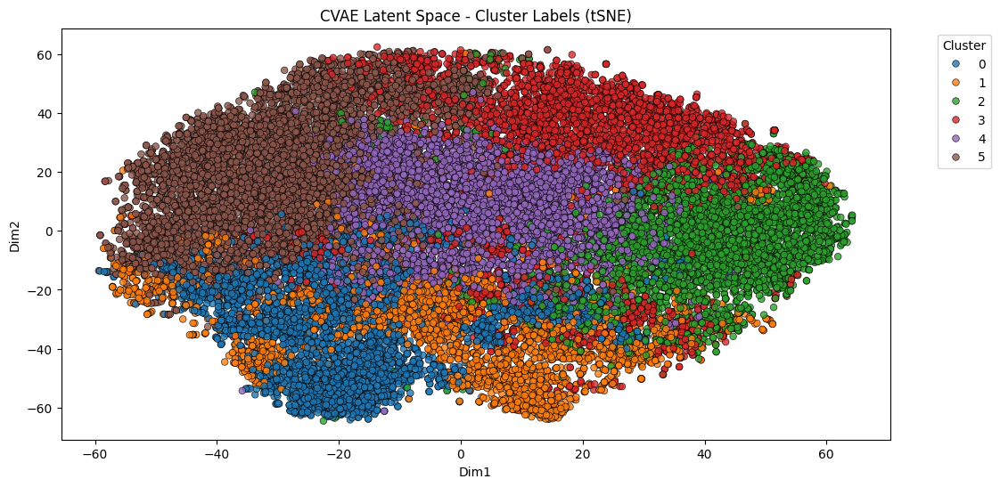

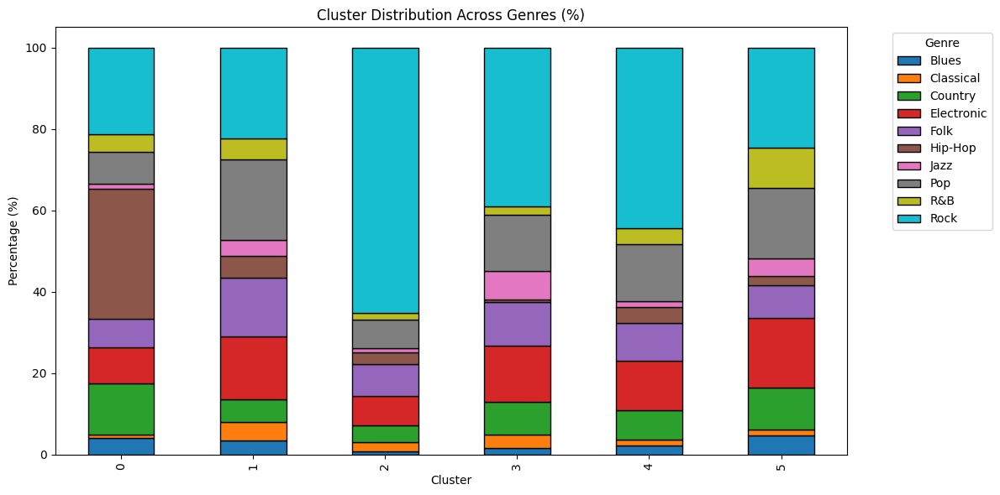

===== Cluster to Genre Mapping =====
genre  Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz   Pop  R&B  \
row_0                                                                          
0        163         32      492         347   279     1259    45   304  175   
1        104        136      163         456   433      156   117   590  149   
2         28         89      161         289   305      110    42   273   68   
3         59        120      305         512   394       23   262   514   76   
4         95         71      317         537   411      174    63   620  171   
5        286         86      620        1040   477      144   255  1054  589   

genre  Rock  
row_0        
0       837  
1       664  
2      2554  
3      1450  
4      1965  
5      1490  


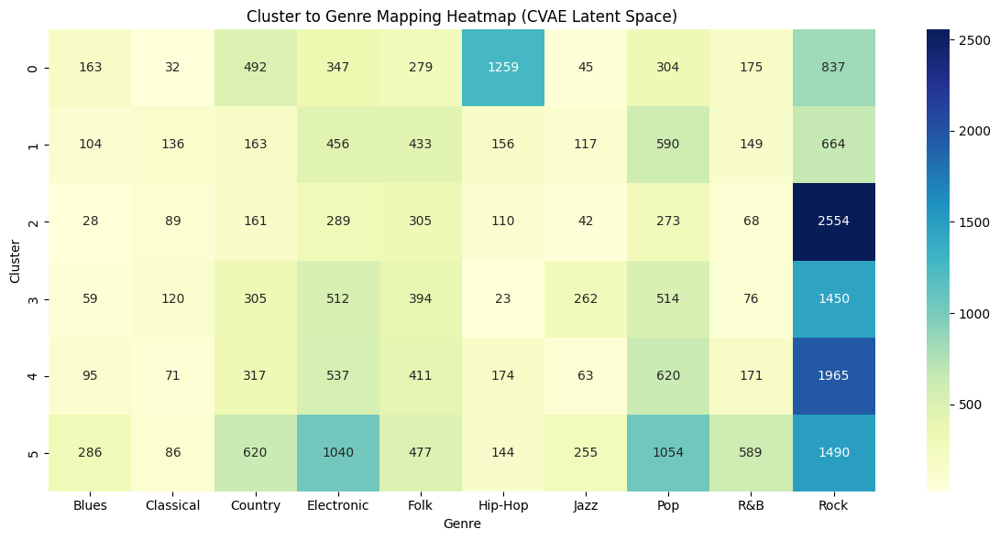


Cluster Composition Percentages (CVAE Latent Space) Experimental:
genre       Blues  Classical    Country  Electronic       Folk    Hip-Hop  \
cluster                                                                     
0        4.144419   0.813628  12.509535    8.822782   7.093822  32.011187   
1        3.504043   4.582210   5.491914   15.363881  14.588949   5.256065   
2        0.714468   2.270987   4.108191    7.374330   7.782598   2.806838   
3        1.588156   3.230148   8.209960   13.781965  10.605653   0.619112   
4        2.147378   1.604882   7.165461   12.138336   9.290235   3.933092   
5        4.734316   1.423605  10.263201   17.215693   7.896044   2.383711   

genre        Jazz        Pop       R&B       Rock  
cluster                                            
0        1.144165   7.729469  4.449530  21.281465  
1        3.942049  19.878706  5.020216  22.371968  
2        1.071702   6.966063  1.735137  65.169686  
3        7.052490  13.835801  2.045760  39.030956  
4   

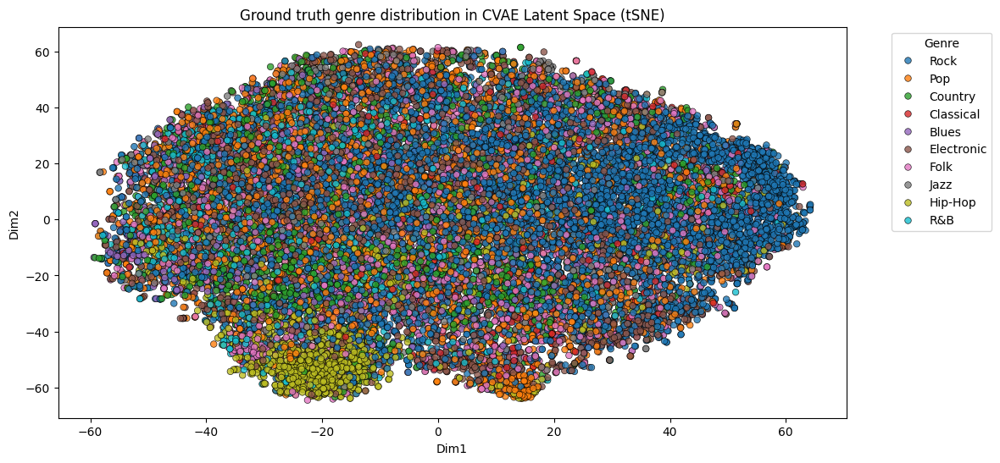

===== Numeric counts per Ground Truth Genre (CVAE Latent Space) =====
col_0       count
genre            
Blues         735
Classical     534
Country      2058
Electronic   3181
Folk         2299
Hip-Hop      1866
Jazz          784
Pop          3355
R&B          1228
Rock         8960

Ground Truth Genre Distribution Percentages (CVAE Latent Space):
col_0        count
genre             
Blues        2.940
Classical    2.136
Country      8.232
Electronic  12.724
Folk         9.196
Hip-Hop      7.464
Jazz         3.136
Pop         13.420
R&B          4.912
Rock        35.840


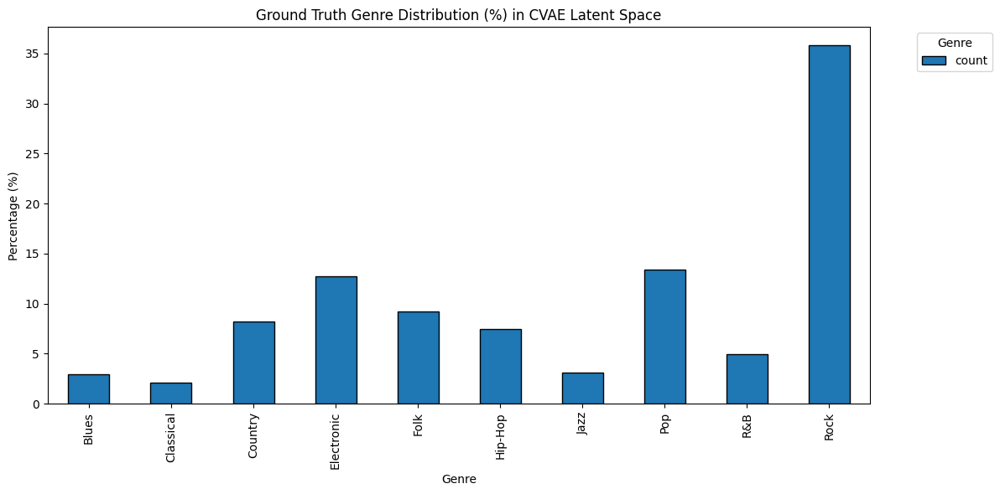

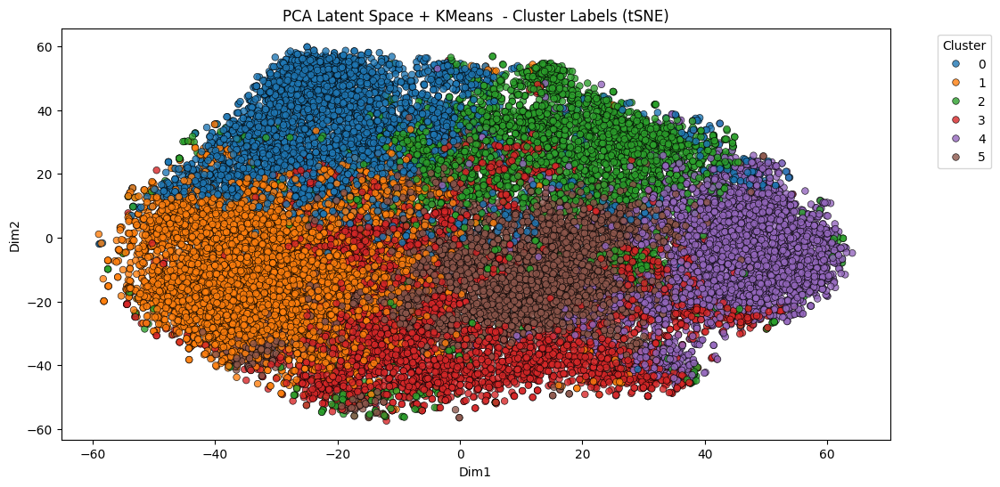

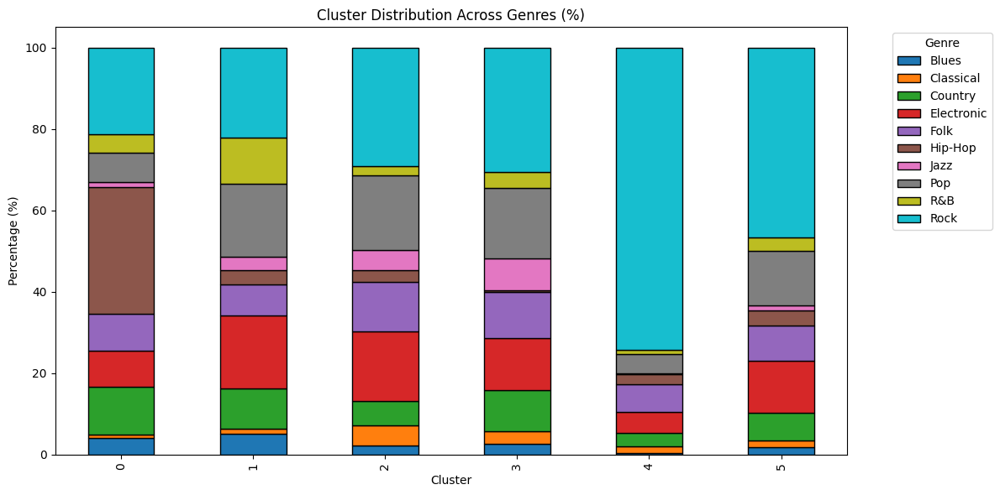

===== Cluster to Genre Mapping =====
genre  Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz  Pop  R&B  \
row_0                                                                         
0        175         38      498         383   385     1323    53  314  194   
1        283         68      550         985   428      188   183  992  621   
2         80        173      214         599   431       97   179  643   84   
3        103        126      398         498   450       17   303  682  154   
4         14         60      114         188   238       91     9  168   35   
5         80         69      284         528   367      150    57  556  140   

genre  Rock  
row_0        
0       908  
1      1224  
2      1025  
3      1205  
4      2652  
5      1946  


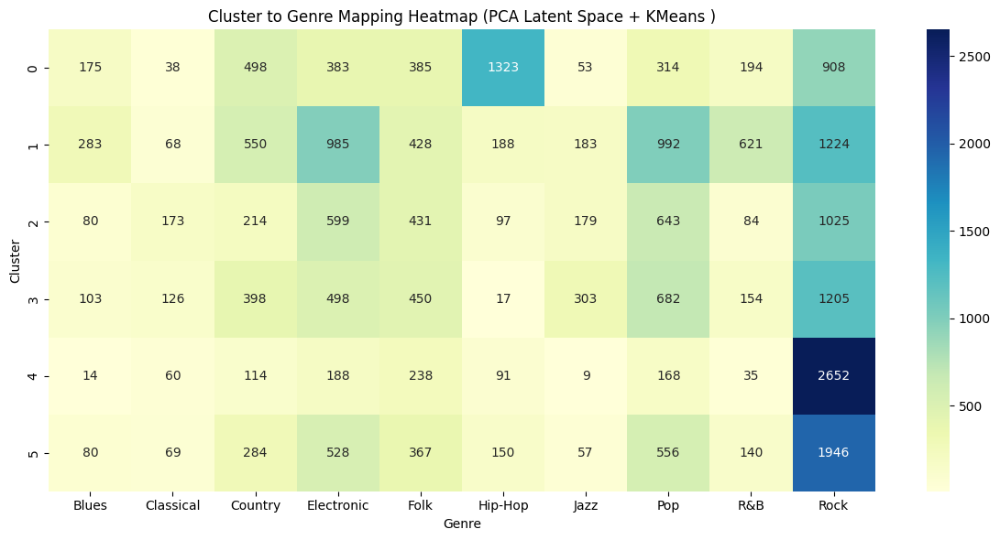


Cluster Composition Percentages (PCA Latent Space + KMeans ) Experimental:
genre       Blues  Classical    Country  Electronic       Folk    Hip-Hop  \
cluster                                                                     
0        4.097401   0.889721  11.660033    8.967455   9.014282  30.976352   
1        5.124955   1.231438   9.960159   17.837740   7.750815   3.404564   
2        2.269504   4.907801   6.070922   16.992908  12.226950   2.751773   
3        2.616870   3.201220  10.111789   12.652439  11.432927   0.431911   
4        0.392267   1.681143   3.194172    5.267582   6.668535   2.549734   
5        1.915250   1.651903   6.799138   12.640651   8.786210   3.591094   

genre        Jazz        Pop        R&B       Rock  
cluster                                             
0        1.240927   7.351908   4.542262  21.259658  
1        3.314017  17.964506  11.245925  22.165882  
2        5.078014  18.241135   2.382979  29.078014  
3        7.698171  17.327236   3.912602  3

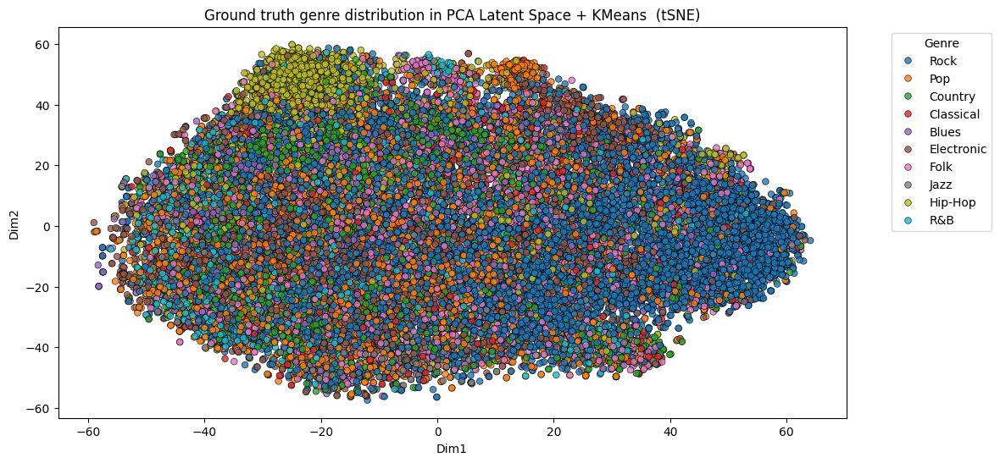

===== Numeric counts per Ground Truth Genre (PCA Latent Space + KMeans ) =====
col_0       count
genre            
Blues         735
Classical     534
Country      2058
Electronic   3181
Folk         2299
Hip-Hop      1866
Jazz          784
Pop          3355
R&B          1228
Rock         8960

Ground Truth Genre Distribution Percentages (PCA Latent Space + KMeans ):
col_0        count
genre             
Blues        2.940
Classical    2.136
Country      8.232
Electronic  12.724
Folk         9.196
Hip-Hop      7.464
Jazz         3.136
Pop         13.420
R&B          4.912
Rock        35.840


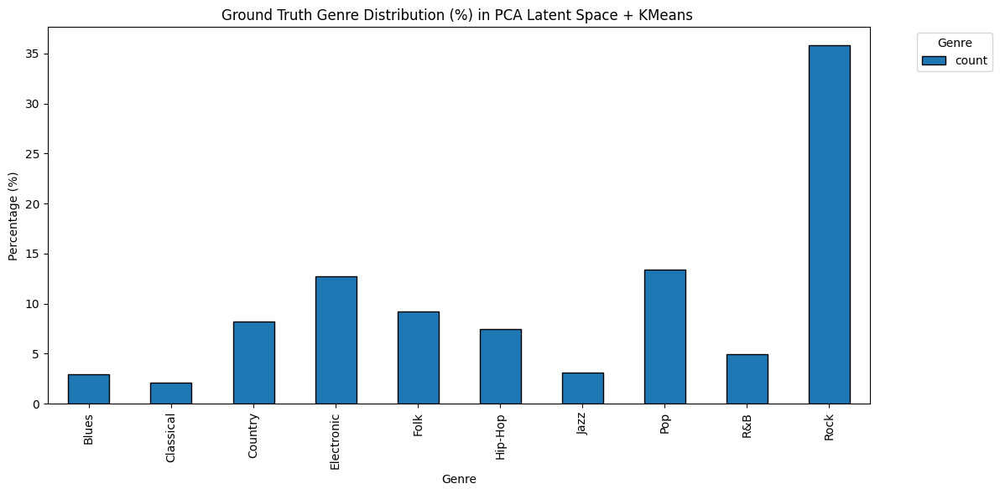

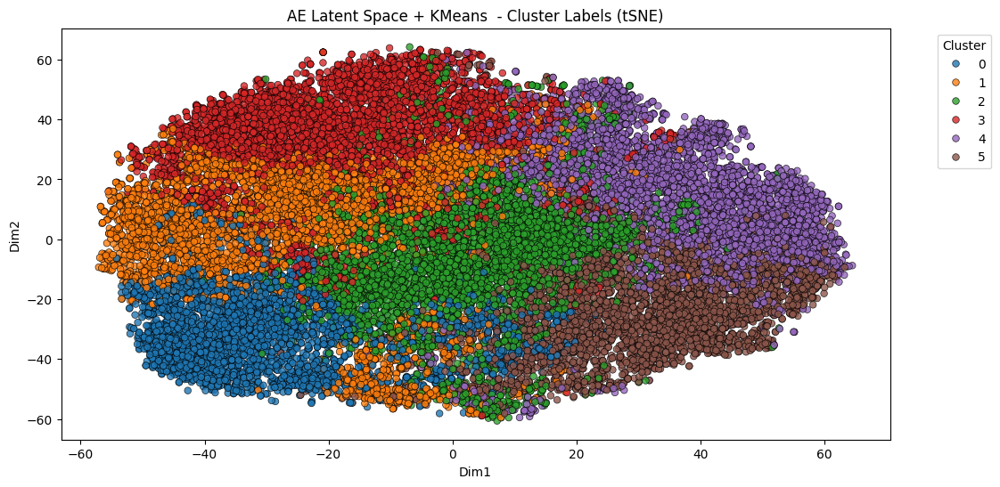

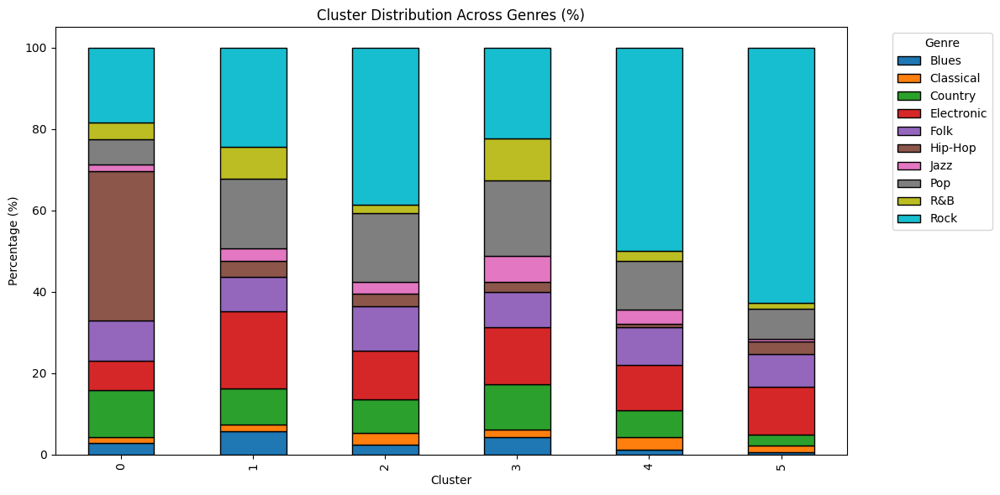

===== Cluster to Genre Mapping =====
genre  Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz  Pop  R&B  \
row_0                                                                         
0        102         46      408         253   349     1294    56  218  147   
1        256         75      393         852   376      173   140  766  353   
2        107        130      362         519   476      142   121  739   97   
3        191         91      502         630   398      106   293  836  469   
4         56        129      293         490   406       33   152  522  106   
5         23         63      100         437   294      118    22  274   56   

genre  Rock  
row_0        
0       645  
1      1088  
2      1689  
3      1012  
4      2191  
5      2335  


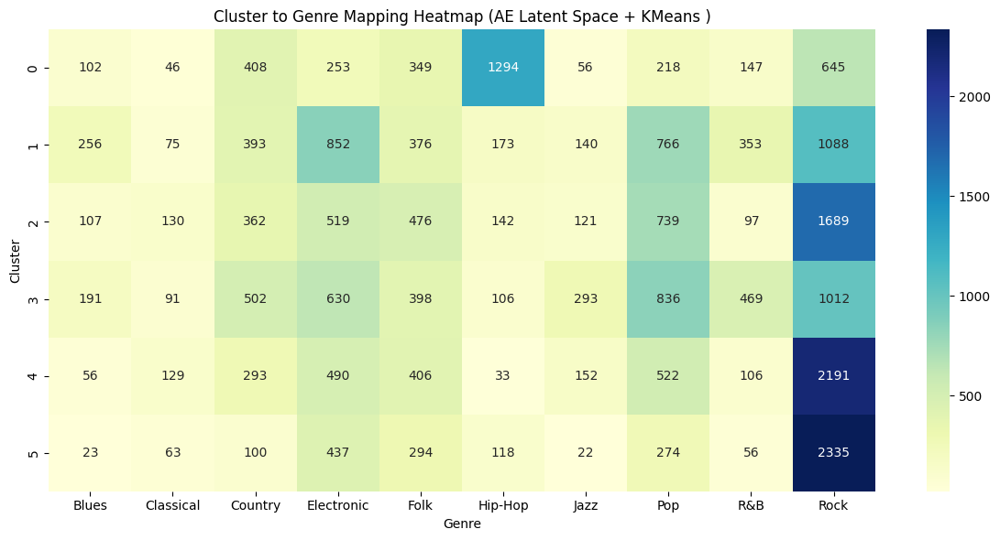


Cluster Composition Percentages (AE Latent Space + KMeans ) Experimental:
genre       Blues  Classical    Country  Electronic       Folk    Hip-Hop  \
cluster                                                                     
0        2.899375   1.307561  11.597499    7.191586   9.920409  36.782263   
1        5.724508   1.677102   8.788014   19.051878   8.407871   3.868515   
2        2.441807   2.966682   8.261068   11.843907  10.862620   3.240529   
3        4.218198   2.009717  11.086572   13.913428   8.789753   2.340989   
4        1.279123   2.946551   6.692554   11.192325   9.273641   0.753769   
5        0.617947   1.692638   2.686728   11.740999   7.898979   3.170339   

genre        Jazz        Pop        R&B       Rock  
cluster                                             
0        1.591814   6.196703   4.178511  18.334281  
1        3.130590  17.128801   7.893560  24.329159  
2        2.761296  16.864445   2.213601  38.544044  
3        6.470848  18.462898  10.357774  22

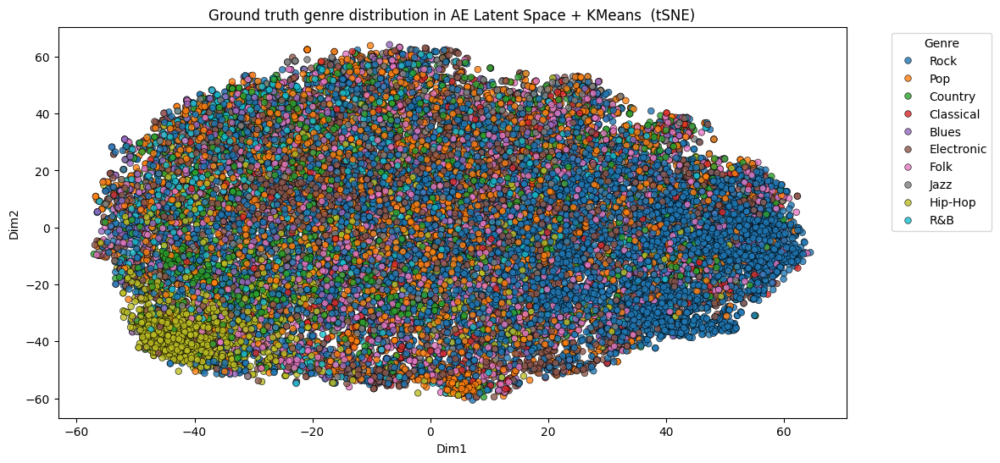

===== Numeric counts per Ground Truth Genre (AE Latent Space + KMeans ) =====
col_0       count
genre            
Blues         735
Classical     534
Country      2058
Electronic   3181
Folk         2299
Hip-Hop      1866
Jazz          784
Pop          3355
R&B          1228
Rock         8960

Ground Truth Genre Distribution Percentages (AE Latent Space + KMeans ):
col_0        count
genre             
Blues        2.940
Classical    2.136
Country      8.232
Electronic  12.724
Folk         9.196
Hip-Hop      7.464
Jazz         3.136
Pop         13.420
R&B          4.912
Rock        35.840


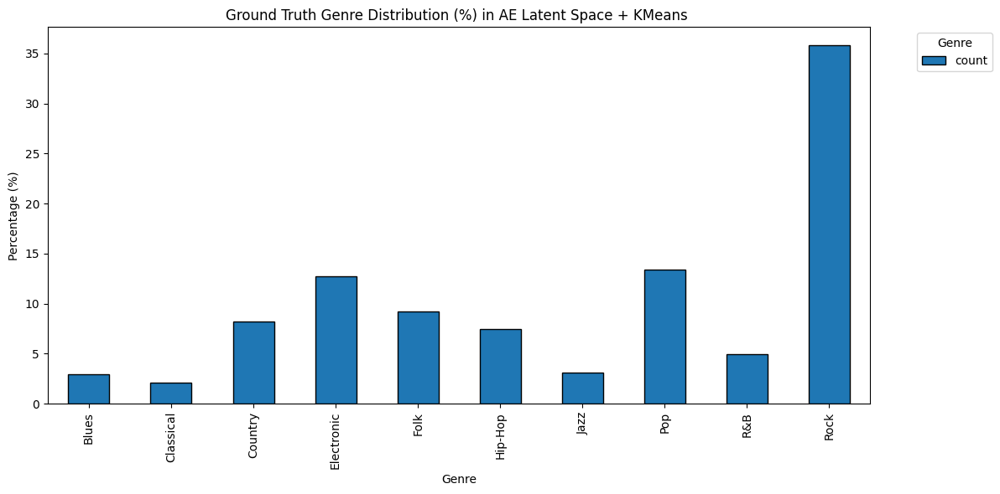

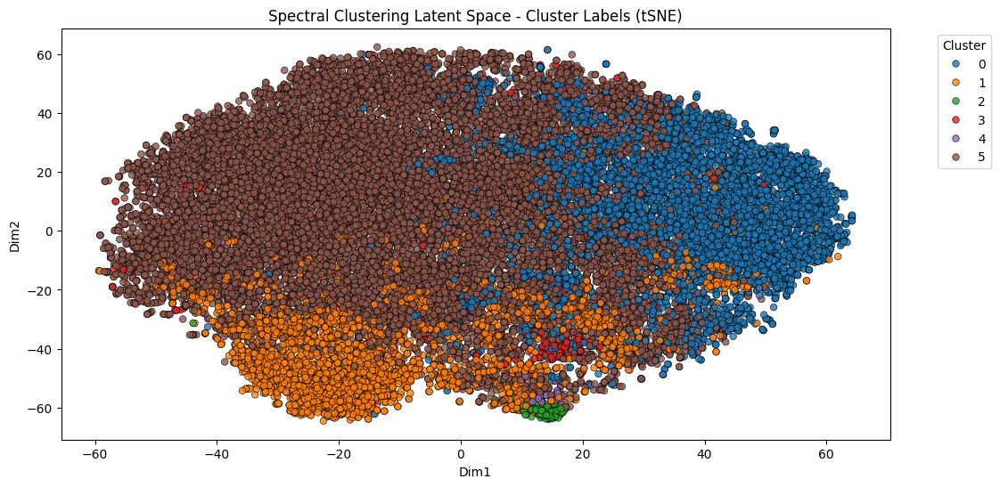

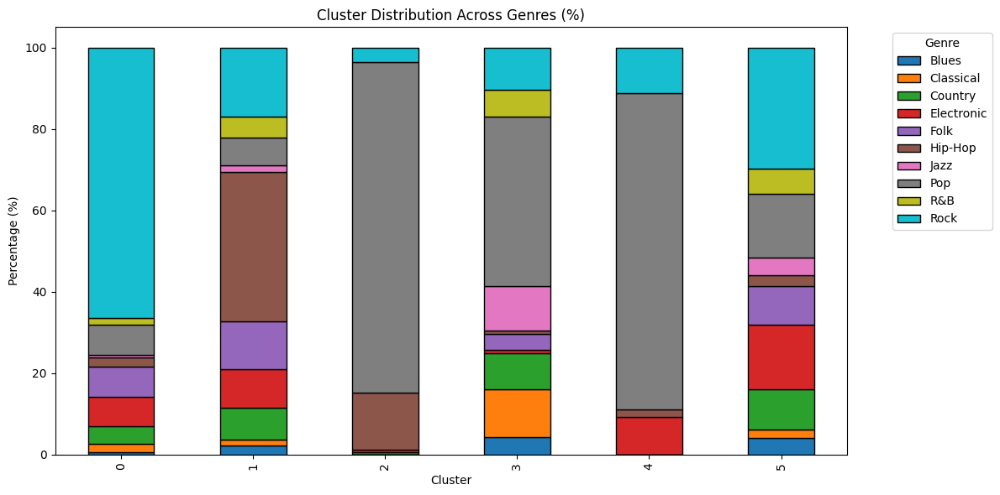

===== Cluster to Genre Mapping =====
genre  Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz   Pop  R&B  \
row_0                                                                          
0         33        121      243         406   422      121    34   428   88   
1         79         52      283         339   422     1318    61   246  179   
2          0          0        1           1     0       23     0   133    0   
3          9         25       19           2     8        2    23    89   14   
4          0          0        0           5     0        1     0    42    0   
5        614        336     1512        2428  1447      401   666  2417  947   

genre  Rock  
row_0        
0      3761  
1       613  
2         6  
3        22  
4         6  
5      4552  


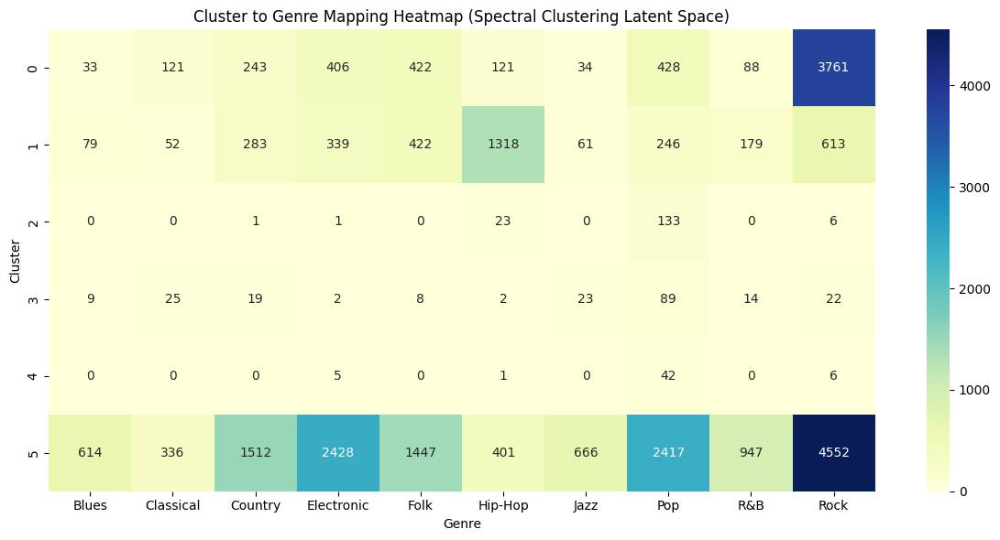


Cluster Composition Percentages (Spectral Clustering Latent Space) Experimental:
genre       Blues  Classical   Country  Electronic       Folk    Hip-Hop  \
cluster                                                                    
0        0.583348   2.138943  4.295563    7.176949   7.459784   2.138943   
1        2.199332   1.447661  7.878619    9.437639  11.748330  36.692650   
2        0.000000   0.000000  0.609756    0.609756   0.000000  14.024390   
3        4.225352  11.737089  8.920188    0.938967   3.755869   0.938967   
4        0.000000   0.000000  0.000000    9.259259   0.000000   1.851852   
5        4.007833   2.193211  9.869452   15.848564   9.445170   2.617493   

genre         Jazz        Pop       R&B       Rock  
cluster                                             
0         0.601025   7.565848  1.555595  66.484002  
1         1.698218   6.848552  4.983296  17.065702  
2         0.000000  81.097561  0.000000   3.658537  
3        10.798122  41.784038  6.572770  10.

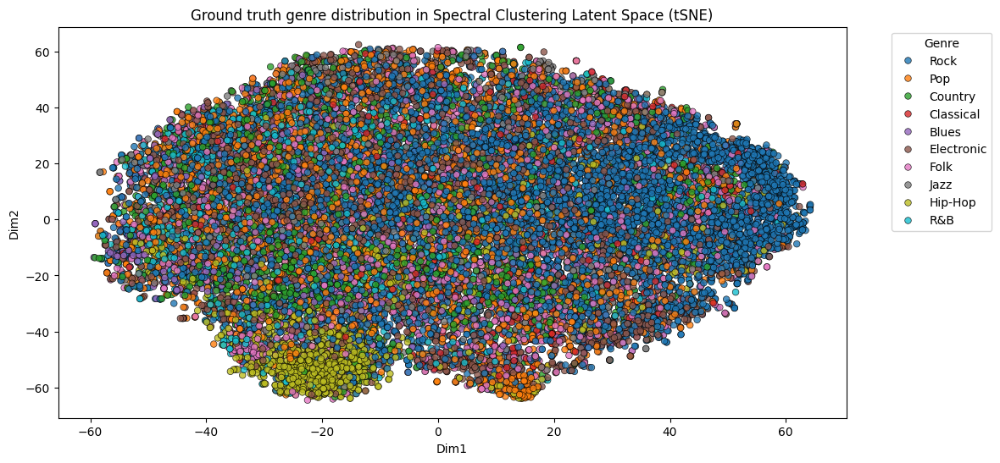

===== Numeric counts per Ground Truth Genre (Spectral Clustering Latent Space) =====
col_0       count
genre            
Blues         735
Classical     534
Country      2058
Electronic   3181
Folk         2299
Hip-Hop      1866
Jazz          784
Pop          3355
R&B          1228
Rock         8960

Ground Truth Genre Distribution Percentages (Spectral Clustering Latent Space):
col_0        count
genre             
Blues        2.940
Classical    2.136
Country      8.232
Electronic  12.724
Folk         9.196
Hip-Hop      7.464
Jazz         3.136
Pop         13.420
R&B          4.912
Rock        35.840


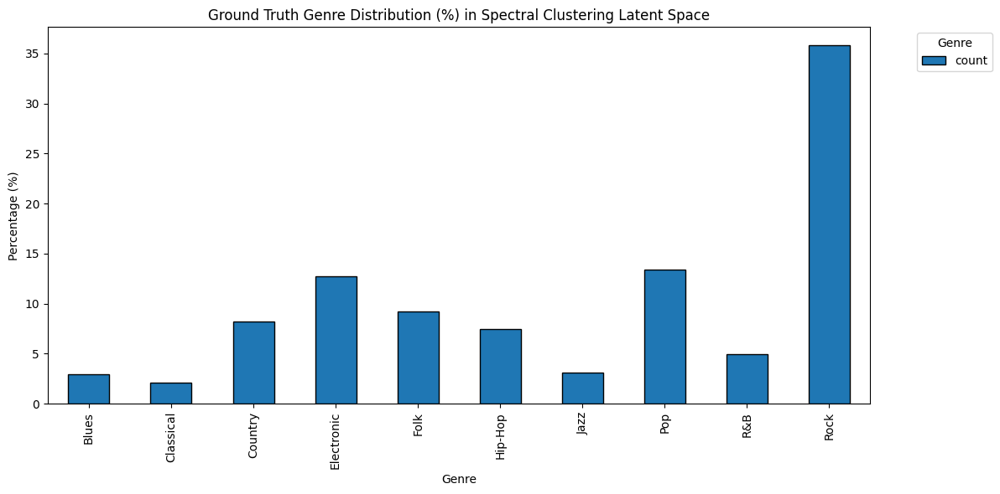

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.manifold import TSNE

def visualize_and_map_clusters(latent_features, cluster_labels, true_labels, title_prefix="Latent Space"):

    tsne = TSNE(n_components=2, perplexity=80, random_state=42)
    features_2d = tsne.fit_transform(latent_features)
    
    plt.figure(figsize=(12,6))
    sns.scatterplot(x=features_2d[:,0], y=features_2d[:,1], hue=cluster_labels, palette='tab10', s=30, alpha=0.8,edgecolor='black',linewidth=0.5)
    plt.title(f"{title_prefix} - Cluster Labels (tSNE)")
    plt.ylabel("Dim2")
    plt.xlabel("Dim1")
    plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

    cluster_genre = pd.DataFrame({
        'cluster': cluster_labels,
        'genre': true_labels
    })
    
    # Create contingency table
    cluster_counts = pd.crosstab(cluster_genre['cluster'], cluster_genre['genre'])
    
    # Convert to percentage
    cluster_percent = cluster_counts.div(cluster_counts.sum(axis=1), axis=0) * 100
    
    # Plot stacked bar chart
    cluster_percent.plot(
        kind='bar',
        stacked=True,
        figsize=(12,6),
        colormap='tab10',
        edgecolor='black'
    )
    
    plt.title("Cluster Distribution Across Genres (%)")
    plt.ylabel("Percentage (%)")
    plt.xlabel("Cluster")
    plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()
    
    cluster_to_genre = pd.crosstab(cluster_labels, true_labels)
    print(f"===== Cluster to Genre Mapping =====")
    print(cluster_to_genre)

    # Heatmap of cluster vs genre
    plt.figure(figsize=(12,6))
    sns.heatmap(cluster_to_genre, annot=True, fmt="d", cmap="YlGnBu", cbar=True)
    plt.title(f"Cluster to Genre Mapping Heatmap ({title_prefix})")
    plt.ylabel("Cluster")
    plt.xlabel("Genre")
    plt.tight_layout()
    plt.show()
    
    print(f"\nCluster Composition Percentages ({title_prefix}) Experimental:")
    print(cluster_percent)
    
    predominant = cluster_to_genre.idxmax(axis=1)
    print("\nPredominant genre per cluster:")
    print(predominant)

    plt.figure(figsize=(12,6))
    sns.scatterplot(x=features_2d[:,0], y=features_2d[:,1], hue=true_labels, palette='tab10', s=30, alpha=0.8,edgecolor='black',linewidth=0.5)
    plt.title(f"Ground truth genre distribution in {title_prefix} (tSNE)")
    plt.ylabel("Dim2")
    plt.xlabel("Dim1")
    plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

    # Numeric counts and stacked bar for ground truth 
    gt_counts = pd.crosstab(index=true_labels, columns="count")
    print(f"===== Numeric counts per Ground Truth Genre ({title_prefix}) =====")
    print(gt_counts)
    
    gt_percent = gt_counts.div(gt_counts.sum(axis=0), axis=1) * 100
    print(f"\nGround Truth Genre Distribution Percentages ({title_prefix}):")
    print(gt_percent)
    
    gt_percent.plot(
        kind='bar', stacked=True, figsize=(12,6),
        colormap='tab10', edgecolor='black'
    )
    plt.title(f"Ground Truth Genre Distribution (%) in {title_prefix}")
    plt.ylabel("Percentage (%)")
    plt.xlabel("Genre")
    plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()
    

# For CVAE latent features
visualize_and_map_clusters(latent_features, cluster_labels, df['genre'], title_prefix="CVAE Latent Space")

# For PCA + KMeans clusters
visualize_and_map_clusters(X_pca, labels_pca, df['genre'], title_prefix="PCA Latent Space + KMeans ")

# For AE + KMeans clusters
visualize_and_map_clusters(latent_ae, labels_ae, df['genre'], title_prefix="AE Latent Space + KMeans ")

# For Spectral Clustering
visualize_and_map_clusters(latent_features, labels, df['genre'], title_prefix="Spectral Clustering Latent Space")


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


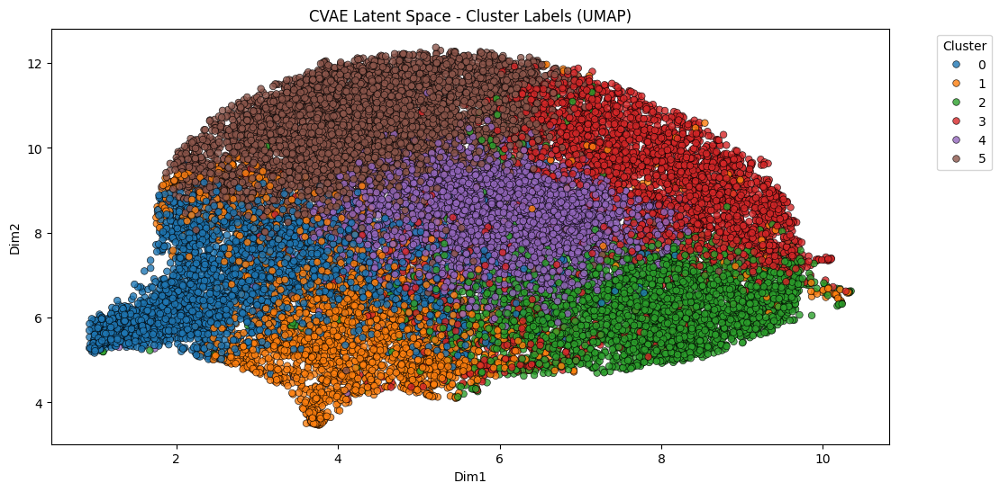

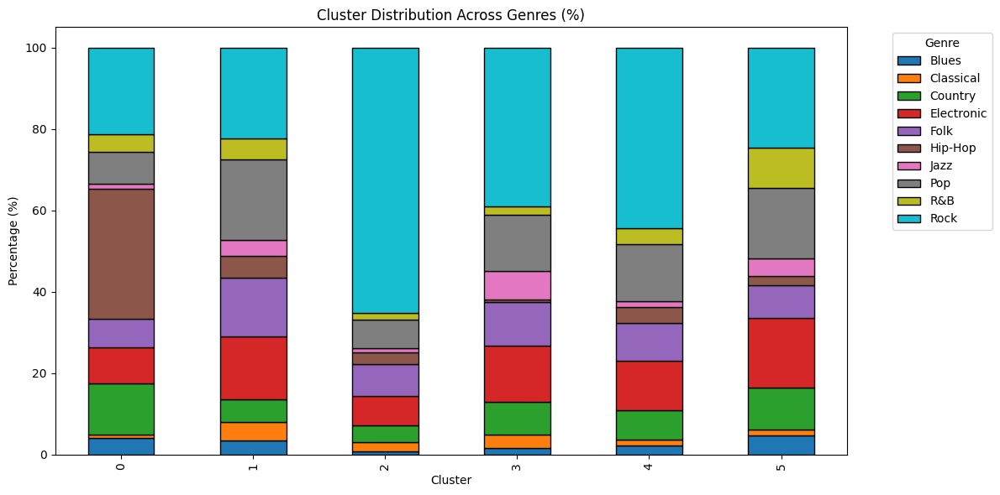

===== Cluster to Genre Mapping =====
genre  Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz   Pop  R&B  \
row_0                                                                          
0        163         32      492         347   279     1259    45   304  175   
1        104        136      163         456   433      156   117   590  149   
2         28         89      161         289   305      110    42   273   68   
3         59        120      305         512   394       23   262   514   76   
4         95         71      317         537   411      174    63   620  171   
5        286         86      620        1040   477      144   255  1054  589   

genre  Rock  
row_0        
0       837  
1       664  
2      2554  
3      1450  
4      1965  
5      1490  


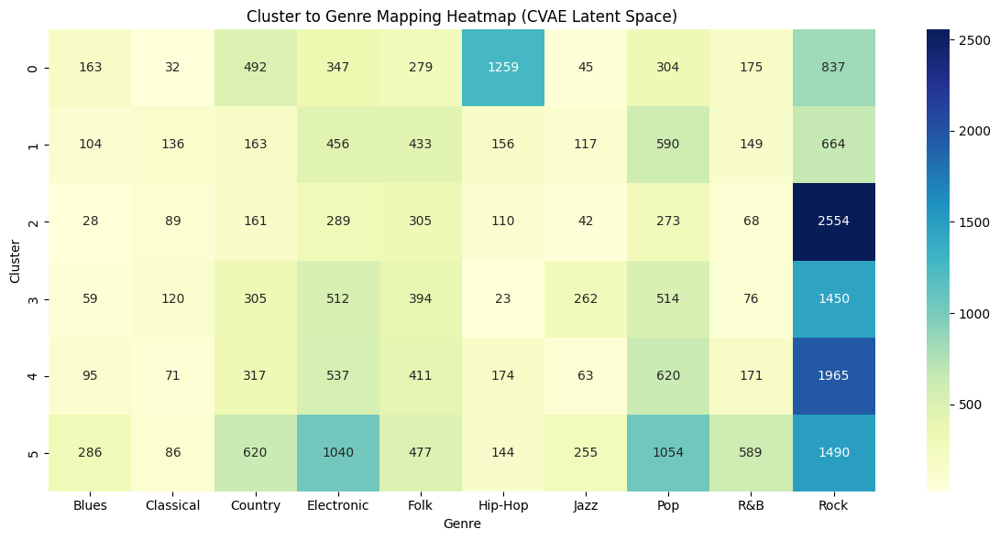


Cluster Composition Percentages (CVAE Latent Space) Experimental:
genre       Blues  Classical    Country  Electronic       Folk    Hip-Hop  \
cluster                                                                     
0        4.144419   0.813628  12.509535    8.822782   7.093822  32.011187   
1        3.504043   4.582210   5.491914   15.363881  14.588949   5.256065   
2        0.714468   2.270987   4.108191    7.374330   7.782598   2.806838   
3        1.588156   3.230148   8.209960   13.781965  10.605653   0.619112   
4        2.147378   1.604882   7.165461   12.138336   9.290235   3.933092   
5        4.734316   1.423605  10.263201   17.215693   7.896044   2.383711   

genre        Jazz        Pop       R&B       Rock  
cluster                                            
0        1.144165   7.729469  4.449530  21.281465  
1        3.942049  19.878706  5.020216  22.371968  
2        1.071702   6.966063  1.735137  65.169686  
3        7.052490  13.835801  2.045760  39.030956  
4   

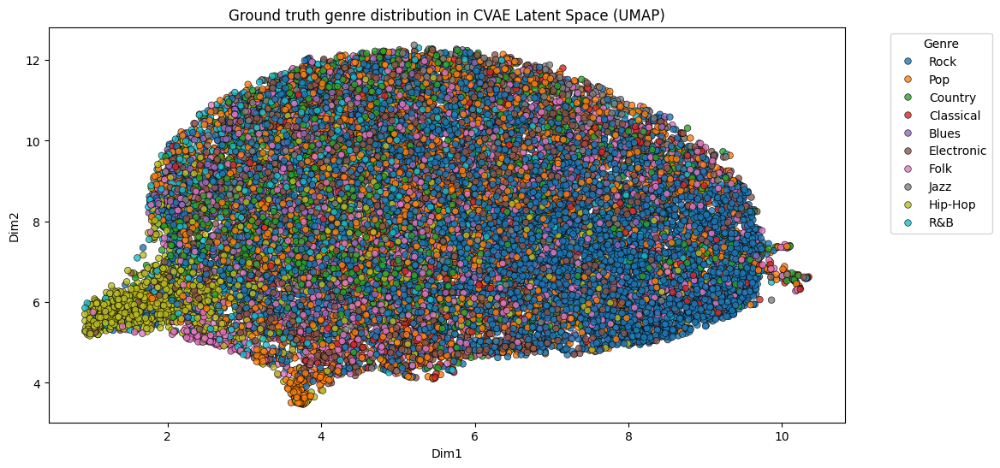

===== Numeric counts per Ground Truth Genre (CVAE Latent Space) =====
col_0       count
genre            
Blues         735
Classical     534
Country      2058
Electronic   3181
Folk         2299
Hip-Hop      1866
Jazz          784
Pop          3355
R&B          1228
Rock         8960

Ground Truth Genre Distribution Percentages (CVAE Latent Space):
col_0        count
genre             
Blues        2.940
Classical    2.136
Country      8.232
Electronic  12.724
Folk         9.196
Hip-Hop      7.464
Jazz         3.136
Pop         13.420
R&B          4.912
Rock        35.840


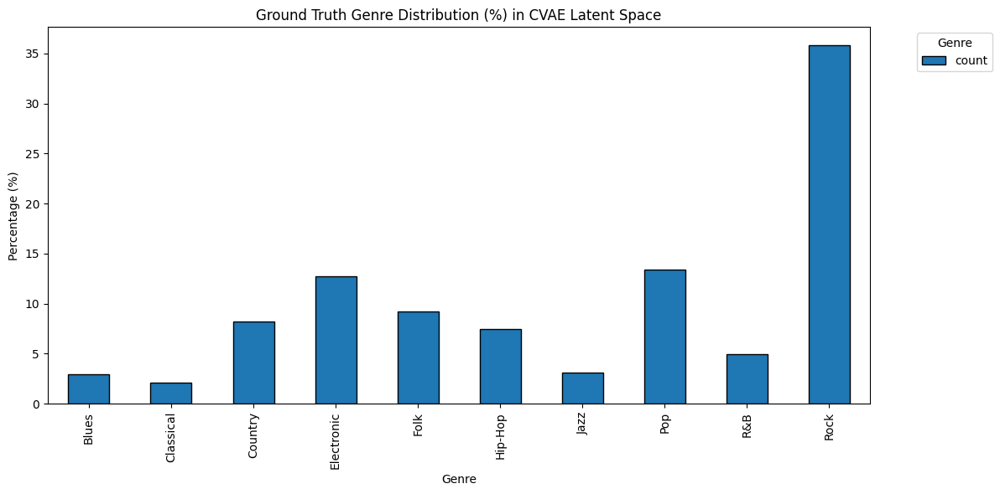

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


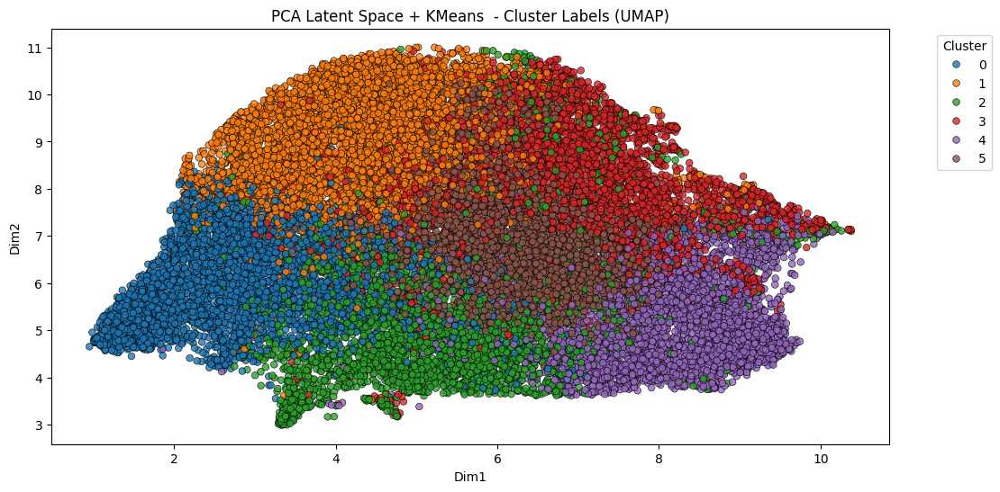

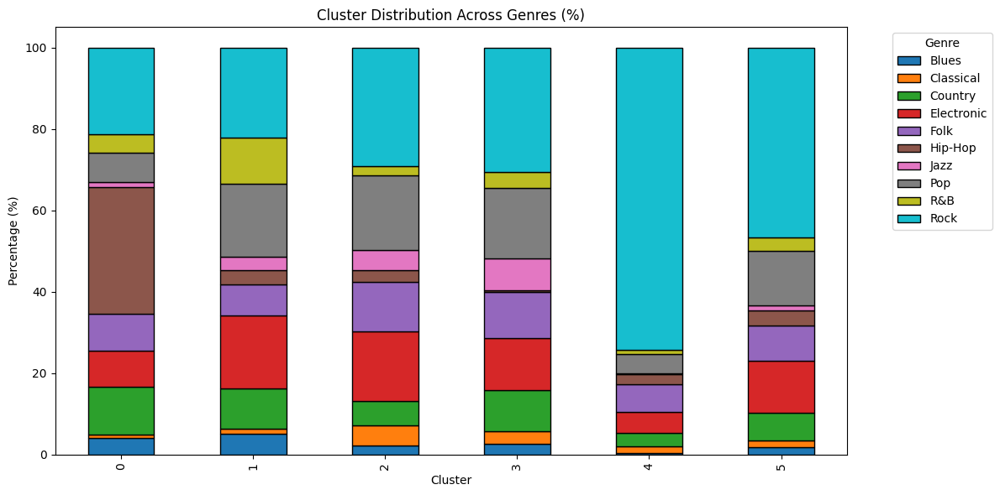

===== Cluster to Genre Mapping =====
genre  Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz  Pop  R&B  \
row_0                                                                         
0        175         38      498         383   385     1323    53  314  194   
1        283         68      550         985   428      188   183  992  621   
2         80        173      214         599   431       97   179  643   84   
3        103        126      398         498   450       17   303  682  154   
4         14         60      114         188   238       91     9  168   35   
5         80         69      284         528   367      150    57  556  140   

genre  Rock  
row_0        
0       908  
1      1224  
2      1025  
3      1205  
4      2652  
5      1946  


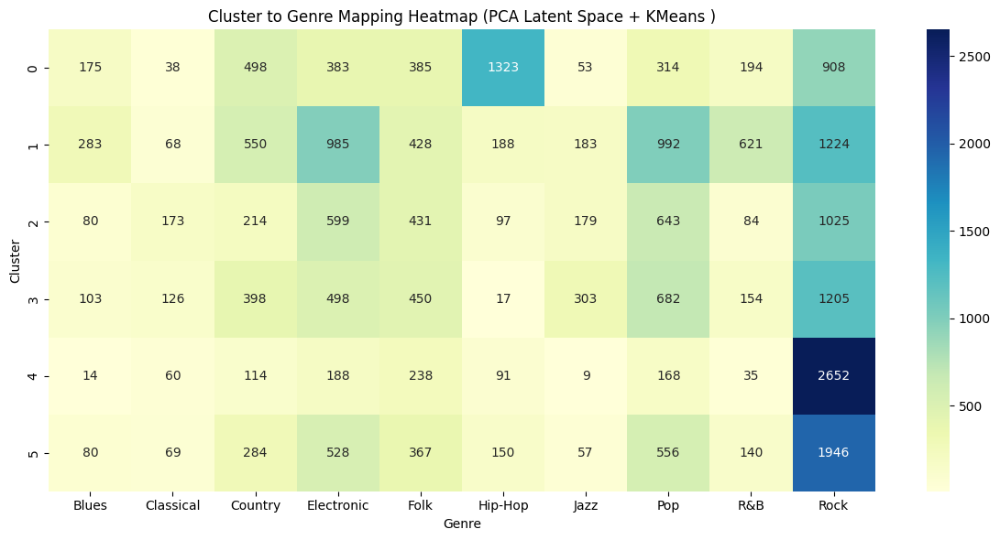


Cluster Composition Percentages (PCA Latent Space + KMeans ) Experimental:
genre       Blues  Classical    Country  Electronic       Folk    Hip-Hop  \
cluster                                                                     
0        4.097401   0.889721  11.660033    8.967455   9.014282  30.976352   
1        5.124955   1.231438   9.960159   17.837740   7.750815   3.404564   
2        2.269504   4.907801   6.070922   16.992908  12.226950   2.751773   
3        2.616870   3.201220  10.111789   12.652439  11.432927   0.431911   
4        0.392267   1.681143   3.194172    5.267582   6.668535   2.549734   
5        1.915250   1.651903   6.799138   12.640651   8.786210   3.591094   

genre        Jazz        Pop        R&B       Rock  
cluster                                             
0        1.240927   7.351908   4.542262  21.259658  
1        3.314017  17.964506  11.245925  22.165882  
2        5.078014  18.241135   2.382979  29.078014  
3        7.698171  17.327236   3.912602  3

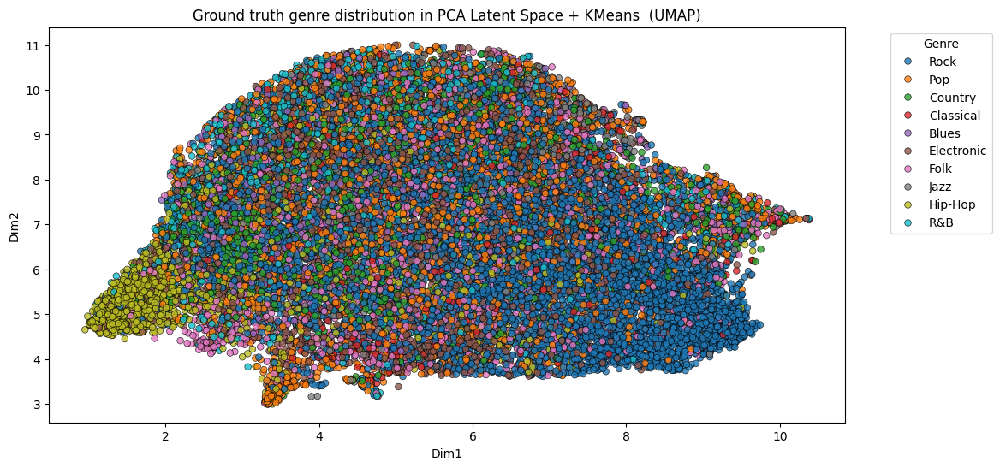

===== Numeric counts per Ground Truth Genre (PCA Latent Space + KMeans ) =====
col_0       count
genre            
Blues         735
Classical     534
Country      2058
Electronic   3181
Folk         2299
Hip-Hop      1866
Jazz          784
Pop          3355
R&B          1228
Rock         8960

Ground Truth Genre Distribution Percentages (PCA Latent Space + KMeans ):
col_0        count
genre             
Blues        2.940
Classical    2.136
Country      8.232
Electronic  12.724
Folk         9.196
Hip-Hop      7.464
Jazz         3.136
Pop         13.420
R&B          4.912
Rock        35.840


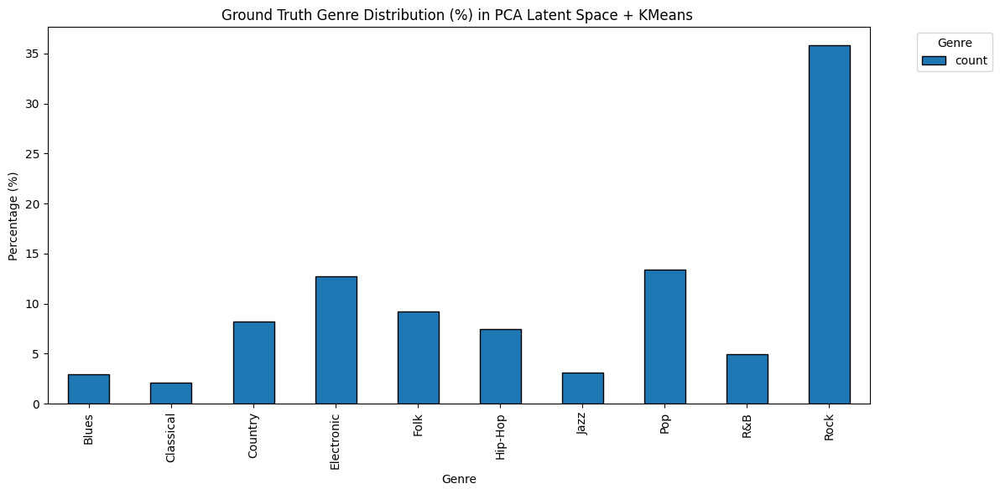

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


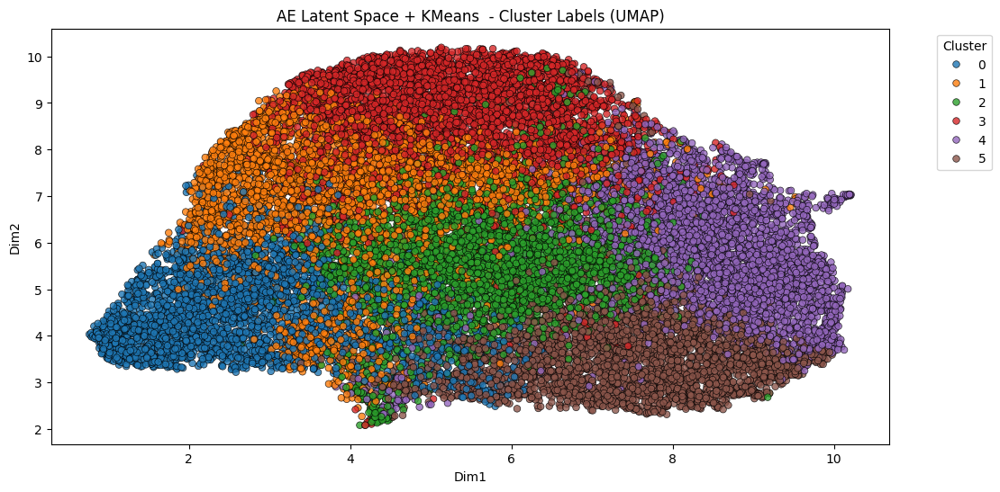

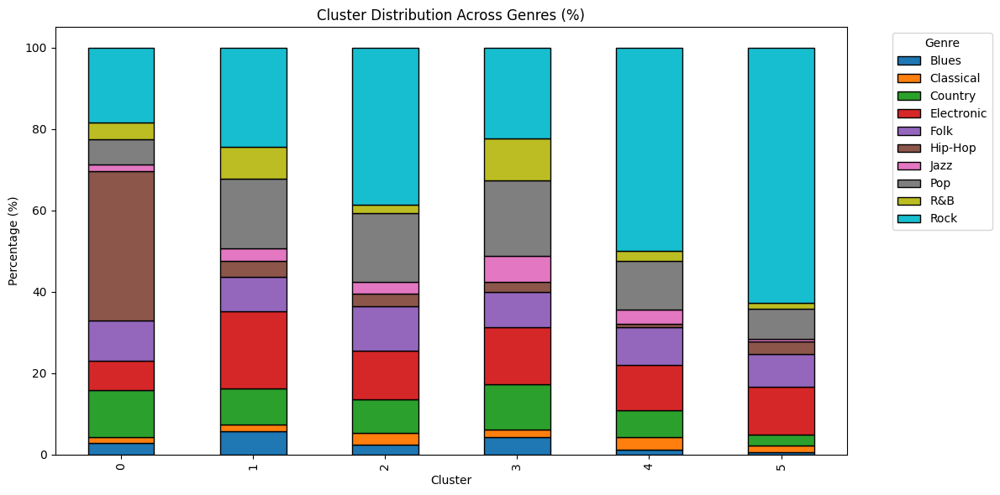

===== Cluster to Genre Mapping =====
genre  Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz  Pop  R&B  \
row_0                                                                         
0        102         46      408         253   349     1294    56  218  147   
1        256         75      393         852   376      173   140  766  353   
2        107        130      362         519   476      142   121  739   97   
3        191         91      502         630   398      106   293  836  469   
4         56        129      293         490   406       33   152  522  106   
5         23         63      100         437   294      118    22  274   56   

genre  Rock  
row_0        
0       645  
1      1088  
2      1689  
3      1012  
4      2191  
5      2335  


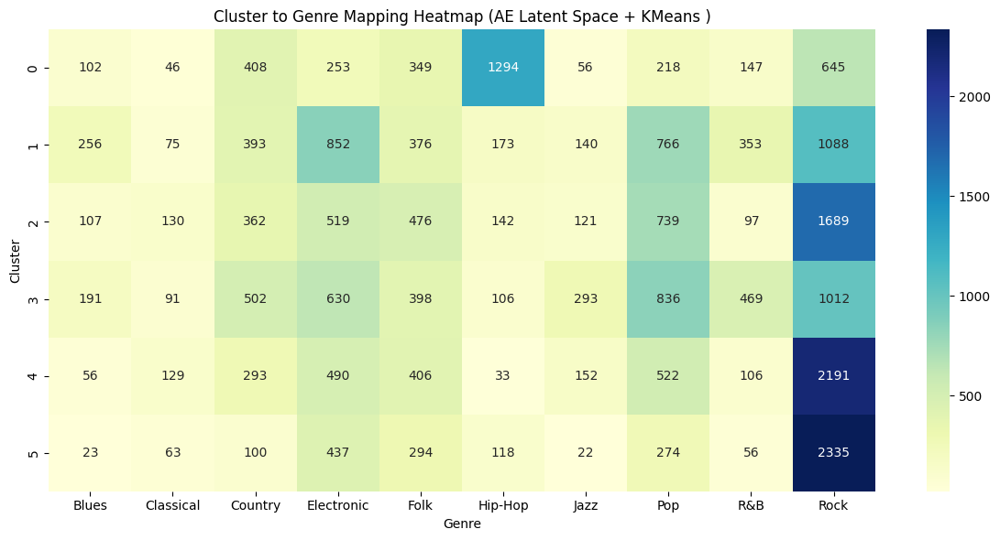


Cluster Composition Percentages (AE Latent Space + KMeans ) Experimental:
genre       Blues  Classical    Country  Electronic       Folk    Hip-Hop  \
cluster                                                                     
0        2.899375   1.307561  11.597499    7.191586   9.920409  36.782263   
1        5.724508   1.677102   8.788014   19.051878   8.407871   3.868515   
2        2.441807   2.966682   8.261068   11.843907  10.862620   3.240529   
3        4.218198   2.009717  11.086572   13.913428   8.789753   2.340989   
4        1.279123   2.946551   6.692554   11.192325   9.273641   0.753769   
5        0.617947   1.692638   2.686728   11.740999   7.898979   3.170339   

genre        Jazz        Pop        R&B       Rock  
cluster                                             
0        1.591814   6.196703   4.178511  18.334281  
1        3.130590  17.128801   7.893560  24.329159  
2        2.761296  16.864445   2.213601  38.544044  
3        6.470848  18.462898  10.357774  22

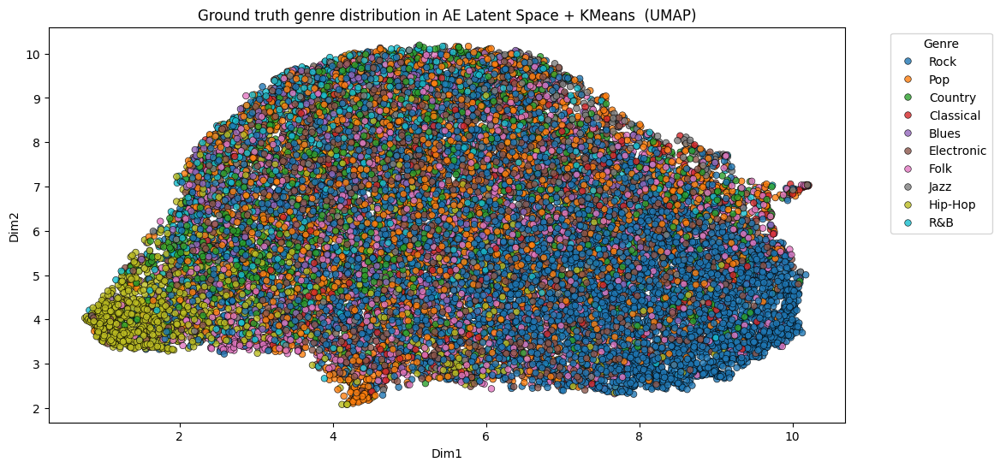

===== Numeric counts per Ground Truth Genre (AE Latent Space + KMeans ) =====
col_0       count
genre            
Blues         735
Classical     534
Country      2058
Electronic   3181
Folk         2299
Hip-Hop      1866
Jazz          784
Pop          3355
R&B          1228
Rock         8960

Ground Truth Genre Distribution Percentages (AE Latent Space + KMeans ):
col_0        count
genre             
Blues        2.940
Classical    2.136
Country      8.232
Electronic  12.724
Folk         9.196
Hip-Hop      7.464
Jazz         3.136
Pop         13.420
R&B          4.912
Rock        35.840


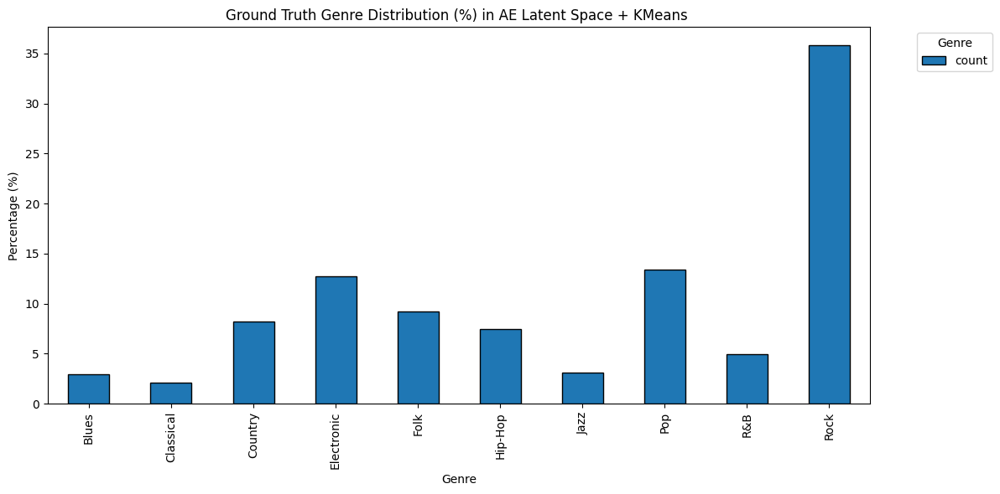

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


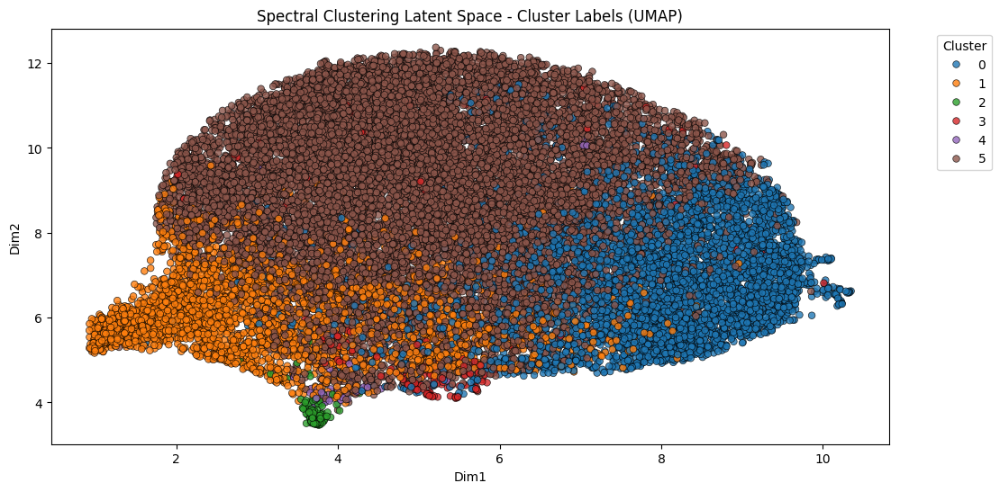

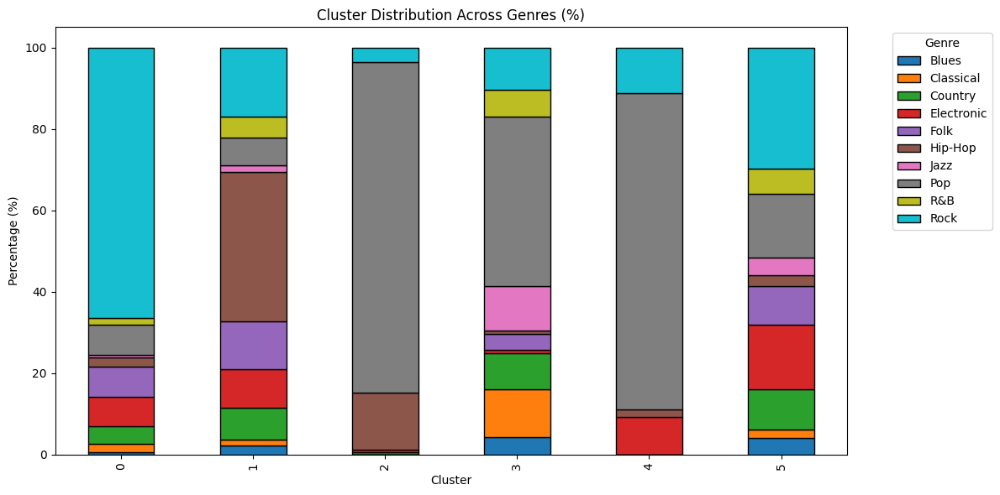

===== Cluster to Genre Mapping =====
genre  Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz   Pop  R&B  \
row_0                                                                          
0         33        121      243         406   422      121    34   428   88   
1         79         52      283         339   422     1318    61   246  179   
2          0          0        1           1     0       23     0   133    0   
3          9         25       19           2     8        2    23    89   14   
4          0          0        0           5     0        1     0    42    0   
5        614        336     1512        2428  1447      401   666  2417  947   

genre  Rock  
row_0        
0      3761  
1       613  
2         6  
3        22  
4         6  
5      4552  


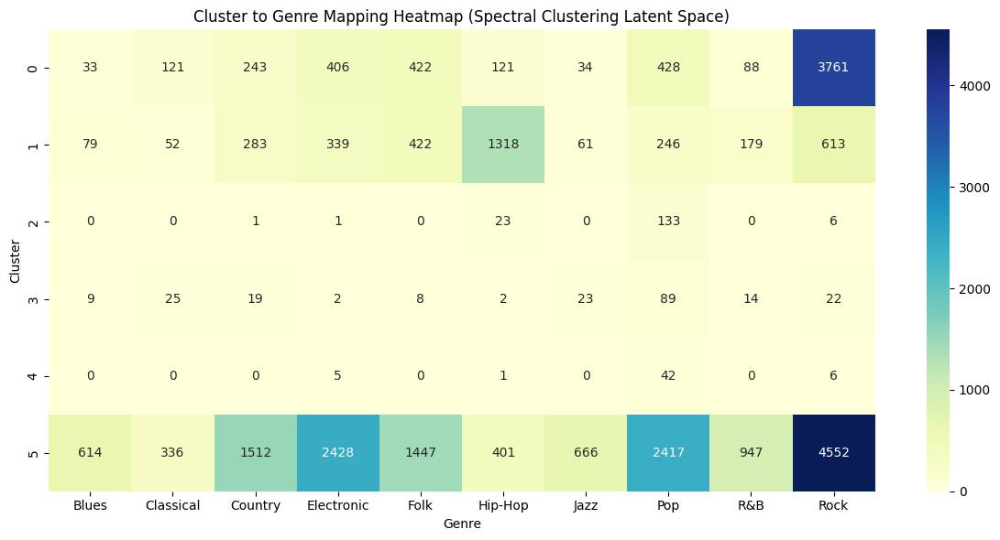


Cluster Composition Percentages (Spectral Clustering Latent Space) Experimental:
genre       Blues  Classical   Country  Electronic       Folk    Hip-Hop  \
cluster                                                                    
0        0.583348   2.138943  4.295563    7.176949   7.459784   2.138943   
1        2.199332   1.447661  7.878619    9.437639  11.748330  36.692650   
2        0.000000   0.000000  0.609756    0.609756   0.000000  14.024390   
3        4.225352  11.737089  8.920188    0.938967   3.755869   0.938967   
4        0.000000   0.000000  0.000000    9.259259   0.000000   1.851852   
5        4.007833   2.193211  9.869452   15.848564   9.445170   2.617493   

genre         Jazz        Pop       R&B       Rock  
cluster                                             
0         0.601025   7.565848  1.555595  66.484002  
1         1.698218   6.848552  4.983296  17.065702  
2         0.000000  81.097561  0.000000   3.658537  
3        10.798122  41.784038  6.572770  10.

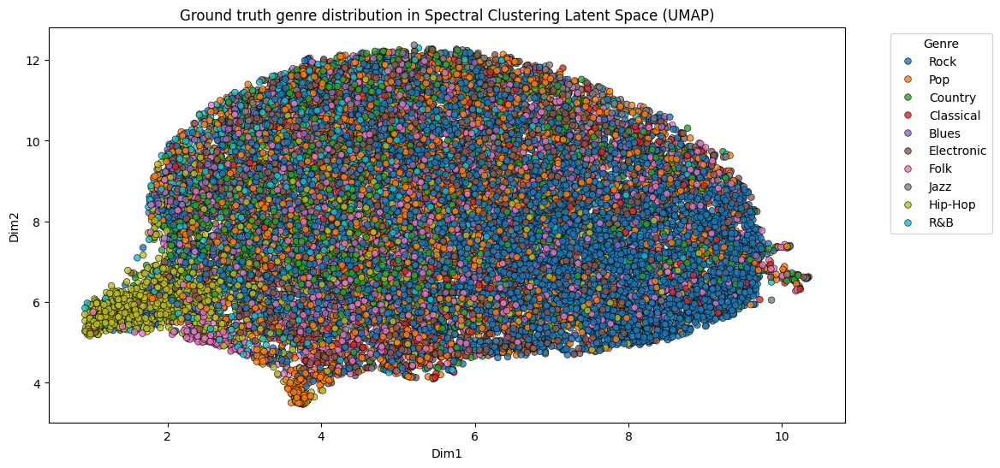

===== Numeric counts per Ground Truth Genre (Spectral Clustering Latent Space) =====
col_0       count
genre            
Blues         735
Classical     534
Country      2058
Electronic   3181
Folk         2299
Hip-Hop      1866
Jazz          784
Pop          3355
R&B          1228
Rock         8960

Ground Truth Genre Distribution Percentages (Spectral Clustering Latent Space):
col_0        count
genre             
Blues        2.940
Classical    2.136
Country      8.232
Electronic  12.724
Folk         9.196
Hip-Hop      7.464
Jazz         3.136
Pop         13.420
R&B          4.912
Rock        35.840


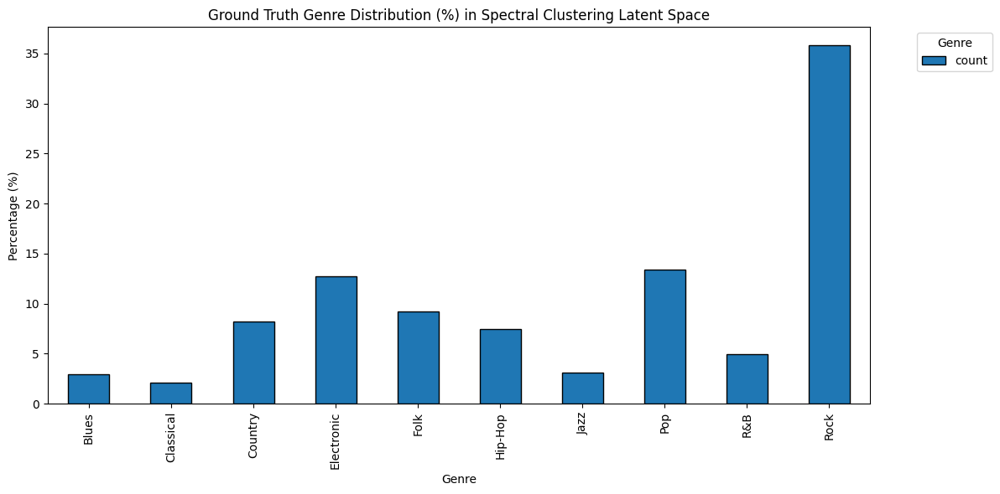

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.manifold import TSNE

def visualize_and_map_clusters(latent_features, cluster_labels, true_labels, title_prefix="Latent Space"):

    reducer = umap.UMAP(n_components=2, n_neighbors=15, min_dist=0.1, random_state=42)
    features_2d = reducer.fit_transform(latent_features)
    
    plt.figure(figsize=(12,6))
    sns.scatterplot(x=features_2d[:,0], y=features_2d[:,1], hue=cluster_labels, palette='tab10', s=30, alpha=0.8,edgecolor='black',linewidth=0.5)
    plt.title(f"{title_prefix} - Cluster Labels (UMAP)")
    plt.ylabel("Dim2")
    plt.xlabel("Dim1")
    plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

    cluster_genre = pd.DataFrame({
        'cluster': cluster_labels,
        'genre': true_labels
    })
    
    # Create contingency table
    cluster_counts = pd.crosstab(cluster_genre['cluster'], cluster_genre['genre'])
    
    # Convert to percentage
    cluster_percent = cluster_counts.div(cluster_counts.sum(axis=1), axis=0) * 100
    
    # Plot stacked bar chart
    cluster_percent.plot(
        kind='bar',
        stacked=True,
        figsize=(12,6),
        colormap='tab10',
        edgecolor='black'
    )
    
    plt.title("Cluster Distribution Across Genres (%)")
    plt.ylabel("Percentage (%)")
    plt.xlabel("Cluster")
    plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()
    
    cluster_to_genre = pd.crosstab(cluster_labels, true_labels)
    print(f"===== Cluster to Genre Mapping =====")
    print(cluster_to_genre)

    # Heatmap of cluster vs genre
    plt.figure(figsize=(12,6))
    sns.heatmap(cluster_to_genre, annot=True, fmt="d", cmap="YlGnBu", cbar=True)
    plt.title(f"Cluster to Genre Mapping Heatmap ({title_prefix})")
    plt.ylabel("Cluster")
    plt.xlabel("Genre")
    plt.tight_layout()
    plt.show()
    
    print(f"\nCluster Composition Percentages ({title_prefix}) Experimental:")
    print(cluster_percent)
    
    predominant = cluster_to_genre.idxmax(axis=1)
    print("\nPredominant genre per cluster:")
    print(predominant)

    plt.figure(figsize=(12,6))
    sns.scatterplot(x=features_2d[:,0], y=features_2d[:,1], hue=true_labels, palette='tab10', s=30, alpha=0.8,edgecolor='black',linewidth=0.5)
    plt.title(f"Ground truth genre distribution in {title_prefix} (UMAP)")
    plt.ylabel("Dim2")
    plt.xlabel("Dim1")
    plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

    # Numeric counts and stacked bar for ground truth 
    gt_counts = pd.crosstab(index=true_labels, columns="count")
    print(f"===== Numeric counts per Ground Truth Genre ({title_prefix}) =====")
    print(gt_counts)
    
    gt_percent = gt_counts.div(gt_counts.sum(axis=0), axis=1) * 100
    print(f"\nGround Truth Genre Distribution Percentages ({title_prefix}):")
    print(gt_percent)
    
    gt_percent.plot(
        kind='bar', stacked=True, figsize=(12,6),
        colormap='tab10', edgecolor='black'
    )
    plt.title(f"Ground Truth Genre Distribution (%) in {title_prefix}")
    plt.ylabel("Percentage (%)")
    plt.xlabel("Genre")
    plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()
    

# For CVAE latent features
visualize_and_map_clusters(latent_features, cluster_labels, df['genre'], title_prefix="CVAE Latent Space")

# For PCA + KMeans clusters
visualize_and_map_clusters(X_pca, labels_pca, df['genre'], title_prefix="PCA Latent Space + KMeans ")

# For AE + KMeans clusters
visualize_and_map_clusters(latent_ae, labels_ae, df['genre'], title_prefix="AE Latent Space + KMeans ")

# For Spectral Clustering
visualize_and_map_clusters(latent_features, labels, df['genre'], title_prefix="Spectral Clustering Latent Space")
